In [1]:
from string import ascii_letters
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime

# in your notebook cell
import sys

# path relative to your notebook
sys.path.insert(0, '../src')

# import as usual
import fun_functions as fun

from yellowbrick.classifier import ConfusionMatrix


# autoreload
%load_ext autoreload
%autoreload 2



In [2]:
air_disaster = pd.read_csv('../data/Aircraft_Incident_Dataset1.csv')

In [3]:
air_disaster

,Incident_Date,Aircaft_Model,Aircaft_Registration,Aircaft_Operator,Aircaft_Nature,Incident_Category,Incident_Cause(es),Incident_Location,Aircaft_Damage_Type,Date,...,Onboard_Crew,Onboard_Passengers,Onboard_Total,Fatalities,Aircaft_First_Flight,Aircraft_Phase,Departure_Airport,Destination_Airport,Ground_Casualties,Collision_Casualties
0,1/3/2022,British Aerospace 4121 Jetstream 41,ZS-NRJ,SA Airlink,Domestic Non Scheduled Passenger,Accident | repairable-damage,"Airplane - Engines, Airplane - Engines - Prop/...",near Venetia Mine...,Substantial,Monday 3 January 2022,...,Fatalities: 0 / Occupants: 3,Fatalities: 0 / Occupants: 4,Fatalities: 0 / Occupants: 7,0,1995-05-19 (26 years 8 months),Landing (LDG),Johannesburg-O.R. Tambo International Airport ...,"Venetia Mine Airport (FAVM) , South Africa",NaN,NaN
1,1/4/2022,British Aerospace 3101 Jetstream 31,HR-AYY,LANHSA,Domestic Scheduled Passenger,Accident | repairable-damage,"Airplane - Undercarriage, Airplane - Undercarr...",Roatán-Juan ...,Substantial,Tuesday 4 January 2022,...,Fatalities: 0 / Occupants:,Fatalities: 0 / Occupants:,Fatalities: 0 / Occupants: 19,0,1985,Landing (LDG),La Ceiba-Goloson International Airport (LCE/MH...,Roatán-Juan Manuel Gálvez International Airpor...,NaN,NaN
2,1/5/2022,Boeing 737-4H6,EP-CAP,Caspian Airlines,Domestic Scheduled Passenger,Accident | repairable-damage,"Airplane - Undercarriage, Airplane - Undercarr...",Isfahan-Shah...,Substantial,Wednesday 5 January 2022,...,Fatalities: 0 / Occupants:,Fatalities: 0 / Occupants:,Fatalities: 0 / Occupants: 116,0,1992-09-18 (29 years 4 months),Landing (LDG),"Mashhad Airport (MHD/OIMM) , Iran","Isfahan-Shahid Beheshti Airport (IFN/OIFM) , Iran",NaN,NaN
3,1/8/2022,Tupolev Tu-204-100C,RA-64032,"Cainiao, opb Aviastar-TU",Cargo,Accident | hull-loss,"Cargo - Fire/smoke, Result - Damaged on the gr...",Hangzhou-Xia...,Destroyed,Saturday 8 January 2022,...,Fatalities: 0 / Occupants: 8,Fatalities: 0 / Occupants: 0,Fatalities: 0 / Occupants: 8,0,2002-07-18 (19 years 6 months),Standing (STD),Hangzhou-Xiaoshan International Airport (HGH/Z...,"Novosibirsk-Tolmachevo Airport (OVB/UNNT) , Ru...",NaN,NaN
4,1/12/2022,Beechcraft 200 Super King Air,NaN,private,Illegal Flight,"Criminal occurrence (sabotage, shoot down) | h...",Result - Damaged on the ground,"Machakilha, ...",Damaged beyond repair,Wednesday 12 January 2022,...,Fatalities: 0 / Occupants: 0,Fatalities: 0 / Occupants: 0,Fatalities: 0 / Occupants: 0,0,NaN,Standing (STD),?,?,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23514,2/25/1920,Handley Page O/400,G-EAMC,Handley Page Transport,Unknown,Accident | hull-loss,"Result - Emergency, forced landing - Outside a...",near El Shereik,Damaged beyond repair,Wednesday 25 February 1920,...,Fatalities: 0 / Occupants: 4,Fatalities: 0 / Occupants: 0,Fatalities: 0 / Occupants: 4,0,NaN,Unknown (UNK),"Aswan Airport (ASW/HESN) , Egypt","Khartoum-Civil Airport (KRT/HSSS) , Sudan",NaN,NaN
23515,6/30/1920,Handley Page O/400,G-EAKE,Handley Page Transport,Demonstration,Accident | hull-loss,"Result - Emergency, forced landing - Outside a...",Östanå,Damaged beyond repair,Wednesday 30 June 1920,...,Fatalities: 0 / Occupants: 2,Fatalities: 0 / Occupants: 0,Fatalities: 0 / Occupants: 2,0,1919,En route (ENR),"Stockholm (unknown airport) , Sweden","Kjeller Air Base (ENKJ) , Norway",NaN,NaN
23516,12/14/1920,Handley Page O/400,G-EAMA,Handley Page Transport,International Scheduled Passenger,Accident | hull-loss,Result - CFIT - Level ground,Golders Green,Damaged beyond repair,Tuesday 14 December 1920,...,Fatalities: 2 / Occupants: 2,Fatalities: 2 / Occupants: 6,Fatalities: 4 / Occupants: 8,4,NaN,Initial climb (ICL),"London-Cricklewood Aerodrome , United Kingdom","Paris-Le Bourget Airport (LBG/LFPB) , France",NaN,NaN
23517,8/2/1919,Caproni Ca.48,NaN,Caproni,Passenger,Accident | hull-loss,Info-Unavailable,Verona,Destroyed,Saturday 2 August 1919,...,Fatalities: 2 / Occupants: 2,Fatalities: 12 / Occupants: 1

In [4]:
air_disaster_1970_on = air_disaster
air_disaster_1970_on['Incident_Date'] = pd.to_datetime(air_disaster_1970_on['Incident_Date'], format="%m/%d/%Y")
air_disaster_1970_on['Year'] = air_disaster_1970_on['Incident_Date'].dt.year
air_disaster_1970_on = air_disaster_1970_on[air_disaster_1970_on['Year'] >= 1970]

In [5]:
incidents_by_phase = pd.DataFrame(air_disaster_1970_on['Aircraft_Phase'].value_counts()).reset_index()
incidents_by_phase

,Aircraft_Phase,count
0,Landing (LDG),3107
1,En route (ENR),2698
2,Approach (APR),1625
3,Unknown (UNK),1269
4,Takeoff (TOF),1124
5,Standing (STD),1097
6,Initial climb (ICL),659
7,Taxi (TXI),345
8,Maneuvering (MNV),236
9,Pushback / towing (PBT),69


<Axes: xlabel='count', ylabel='Aircraft_Phase'>

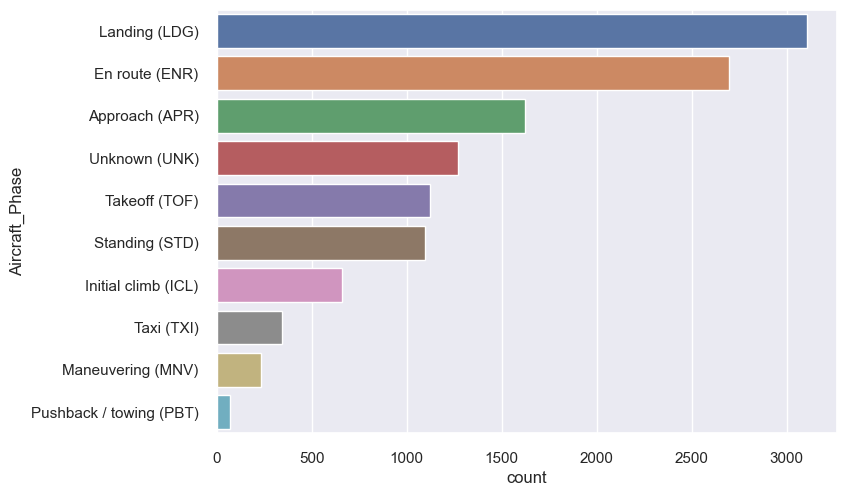

In [6]:
sns.barplot(incidents_by_phase, y='Aircraft_Phase', x='count')

In [7]:
percent =  []

for count in incidents_by_phase['count']:
    percent.append(f"{(count / (incidents_by_phase['count'].sum())):.2f}")

In [8]:
incidents_by_phase['Percent of total'] = percent
incidents_by_phase['Percent of total'] = incidents_by_phase['Percent of total'].astype(float)

<Axes: xlabel='Percent of total', ylabel='Aircraft_Phase'>

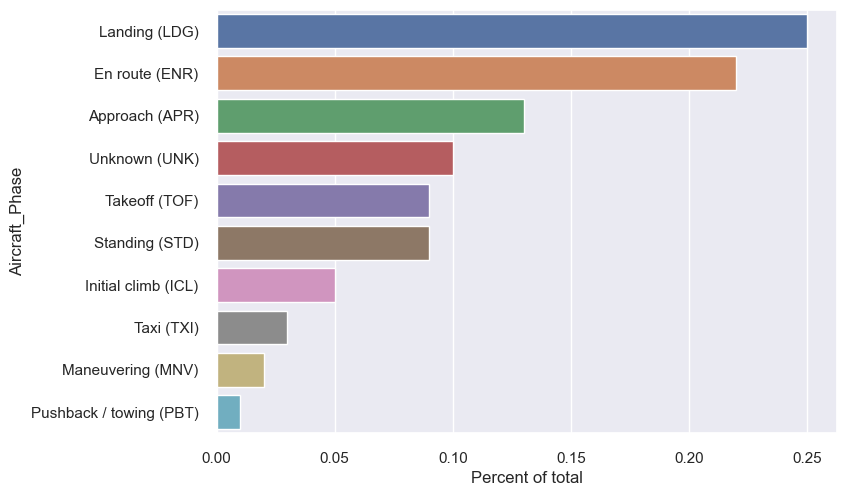

In [9]:
sns.barplot(incidents_by_phase, y='Aircraft_Phase', x='Percent of total')

In [10]:
world_flights = pd.read_csv('../data/API_IS.AIR.DPRT_DS2_en_csv_v2_5735762/API_IS.AIR.DPRT_DS2_en_csv_v2_5735762.csv')

In [11]:
world_flights = world_flights[world_flights['Country Name'] == 'World']

In [12]:
world_flights.fillna(0)

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
259,World,WLD,"Air transport, registered carrier departures w...",IS.AIR.DPRT,0.0,0.0,0.0,0.0,0.0,0.0,...,32160518.88,33026724.98,34030586.0,35337714.0,36299460.06,37405640.25,38082933.01,20098778.56,24054588.85,0.0


In [13]:
world_flights = world_flights.drop(columns=['Country Name','Country Code','Indicator Name','Indicator Code'])

In [14]:
world_flights = world_flights.swapaxes(axis1=0, axis2=1, copy=None).reset_index()

In [15]:
world_flights.rename(columns={'index': 'Year', 259: 'Flights'}, inplace=True)

In [16]:
world_flights.fillna(0, inplace=True)

In [17]:
world_flights = world_flights[world_flights['Flights'] > 0]

In [18]:
df2 = pd.DataFrame({'Year': [1972, 2022], 'Flights': [9634700.00, 32400000]})
#df2 = pd.DataFrame({'Year': [1972], 'Flights': [9634700.00]})

In [19]:
df2

,Year,Flights
0,1972,9634700.0
1,2022,32400000.0


In [20]:
world_flights = pd.concat([world_flights, df2],ignore_index=True)

In [21]:
world_flights['Year'] = world_flights['Year'].astype(int)
world_flights = world_flights.sort_values(by='Year', ascending=True).reset_index()

In [22]:
world_flights

,index,Year,Flights
0,0,1970,9448300.00
1,1,1971,9504500.00
2,51,1972,9634700.00
3,2,1973,9764900.00
4,3,1974,9254900.00
5,4,1975,9244700.00
6,5,1976,9562900.00
7,6,1977,9915900.00
8,7,1978,10183700.00
9,8,1979,10653400.00


<Axes: xlabel='Year', ylabel='Flights'>

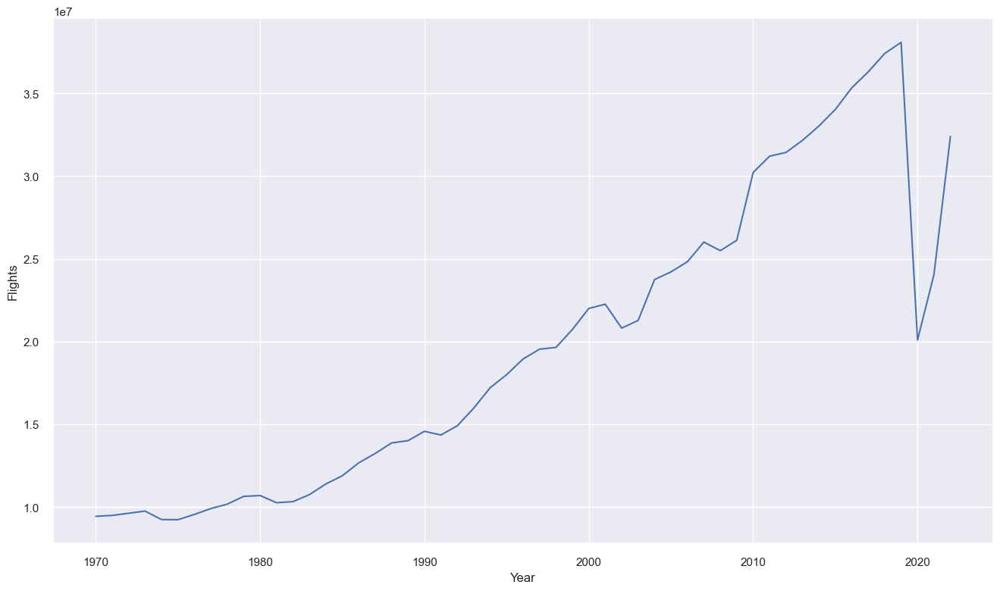

In [23]:
fig, ax = plt.subplots(figsize = (16, 9))
sns.lineplot(world_flights, y='Flights', x='Year')

In [24]:
air_disaster.shape

(23519, 24)

In [25]:
air_disaster.head()

,Incident_Date,Aircaft_Model,Aircaft_Registration,Aircaft_Operator,Aircaft_Nature,Incident_Category,Incident_Cause(es),Incident_Location,Aircaft_Damage_Type,Date,...,Onboard_Passengers,Onboard_Total,Fatalities,Aircaft_First_Flight,Aircraft_Phase,Departure_Airport,Destination_Airport,Ground_Casualties,Collision_Casualties,Year
0,2022-01-03,British Aerospace 4121 Jetstream 41,ZS-NRJ,SA Airlink,Domestic Non Scheduled Passenger,Accident | repairable-damage,"Airplane - Engines, Airplane - Engines - Prop/...",near Venetia Mine...,Substantial,Monday 3 January 2022,...,Fatalities: 0 / Occupants: 4,Fatalities: 0 / Occupants: 7,0,1995-05-19 (26 years 8 months),Landing (LDG),Johannesburg-O.R. Tambo International Airport ...,"Venetia Mine Airport (FAVM) , South Africa",NaN,NaN,2022
1,2022-01-04,British Aerospace 3101 Jetstream 31,HR-AYY,LANHSA,Domestic Scheduled Passenger,Accident | repairable-damage,"Airplane - Undercarriage, Airplane - Undercarr...",Roatán-Juan ...,Substantial,Tuesday 4 January 2022,...,Fatalities: 0 / Occupants:,Fatalities: 0 / Occupants: 19,0,1985,Landing (LDG),La Ceiba-Goloson International Airport (LCE/MH...,Roatán-Juan Manuel Gálvez International Airpor...,NaN,NaN,2022
2,2022-01-05,Boeing 737-4H6,EP-CAP,Caspian Airlines,Domestic Scheduled Passenger,Accident | repairable-damage,"Airplane - Undercarriage, Airplane - Undercarr...",Isfahan-Shah...,Substantial,Wednesday 5 January 2022,...,Fatalities: 0 / Occupants:,Fatalities: 0 / Occupants: 116,0,1992-09-18 (29 years 4 months),Landing (LDG),"Mashhad Airport (MHD/OIMM) , Iran","Isfahan-Shahid Beheshti Airport (IFN/OIFM) , Iran",NaN,NaN,2022
3,2022-01-08,Tupolev Tu-204-100C,RA-64032,"Cainiao, opb Aviastar-TU",Cargo,Accident | hull-loss,"Cargo - Fire/smoke, Result - Damaged on the gr...",Hangzhou-Xia...,Destroyed,Saturday 8 January 2022,...,Fatalities: 0 / Occupants: 0,Fatalities: 0 / Occupants: 8,0,2002-07-18 (19 years 6 months),Standing (STD),Hangzhou-Xiaoshan International Airport (HGH/Z...,"Novosibirsk-Tolmachevo Airport (OVB/UNNT) , Ru...",NaN,NaN,2022
4,2022-01-12,Beechcraft 200 Super King Air,NaN,private,Illegal Flight,"Criminal occurrence (sabotage, shoot down) | h...",Result - Damaged on the ground,"Machakilha, ...",Damaged beyond repair,Wednesday 12 January 2022,...,Fatalities: 0 / Occupants: 0,Fatalities: 0 / Occupants: 0,0,NaN,Standing (STD),?,?,NaN,NaN,2022


In [26]:
air_disaster.describe()


,Incident_Date,Fatalities,Year
count,23519,23519.000000,23519.000000
mean,1973-09-01 06:08:57.267740976,5.611931,1973.170713
min,1919-08-02 00:00:00,0.000000,1919.000000
25%,1948-06-06 00:00:00,0.000000,1948.000000
50%,1971-06-11 00:00:00,0.000000,1971.000000
75%,1994-09-29 12:00:00,4.000000,1994.000000
max,2022-02-15 00:00:00,1692.000000,2022.000000
std,NaN,22.205937,24.963880


In [27]:
air_disaster.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23519 entries, 0 to 23518
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Incident_Date         23519 non-null  datetime64[ns]
 1   Aircaft_Model         23519 non-null  object        
 2   Aircaft_Registration  21958 non-null  object        
 3   Aircaft_Operator      23519 non-null  object        
 4   Aircaft_Nature        23519 non-null  object        
 5   Incident_Category     23519 non-null  object        
 6   Incident_Cause(es)    23519 non-null  object        
 7   Incident_Location     22587 non-null  object        
 8   Aircaft_Damage_Type   22751 non-null  object        
 9   Date                  23519 non-null  object        
 10  Time                  9203 non-null   object        
 11  Arit                  23519 non-null  object        
 12  Aircaft_Engines       10636 non-null  object        
 13  Onboard_Crew    

In [28]:
air_disaster.head()

,Incident_Date,Aircaft_Model,Aircaft_Registration,Aircaft_Operator,Aircaft_Nature,Incident_Category,Incident_Cause(es),Incident_Location,Aircaft_Damage_Type,Date,...,Onboard_Passengers,Onboard_Total,Fatalities,Aircaft_First_Flight,Aircraft_Phase,Departure_Airport,Destination_Airport,Ground_Casualties,Collision_Casualties,Year
0,2022-01-03,British Aerospace 4121 Jetstream 41,ZS-NRJ,SA Airlink,Domestic Non Scheduled Passenger,Accident | repairable-damage,"Airplane - Engines, Airplane - Engines - Prop/...",near Venetia Mine...,Substantial,Monday 3 January 2022,...,Fatalities: 0 / Occupants: 4,Fatalities: 0 / Occupants: 7,0,1995-05-19 (26 years 8 months),Landing (LDG),Johannesburg-O.R. Tambo International Airport ...,"Venetia Mine Airport (FAVM) , South Africa",NaN,NaN,2022
1,2022-01-04,British Aerospace 3101 Jetstream 31,HR-AYY,LANHSA,Domestic Scheduled Passenger,Accident | repairable-damage,"Airplane - Undercarriage, Airplane - Undercarr...",Roatán-Juan ...,Substantial,Tuesday 4 January 2022,...,Fatalities: 0 / Occupants:,Fatalities: 0 / Occupants: 19,0,1985,Landing (LDG),La Ceiba-Goloson International Airport (LCE/MH...,Roatán-Juan Manuel Gálvez International Airpor...,NaN,NaN,2022
2,2022-01-05,Boeing 737-4H6,EP-CAP,Caspian Airlines,Domestic Scheduled Passenger,Accident | repairable-damage,"Airplane - Undercarriage, Airplane - Undercarr...",Isfahan-Shah...,Substantial,Wednesday 5 January 2022,...,Fatalities: 0 / Occupants:,Fatalities: 0 / Occupants: 116,0,1992-09-18 (29 years 4 months),Landing (LDG),"Mashhad Airport (MHD/OIMM) , Iran","Isfahan-Shahid Beheshti Airport (IFN/OIFM) , Iran",NaN,NaN,2022
3,2022-01-08,Tupolev Tu-204-100C,RA-64032,"Cainiao, opb Aviastar-TU",Cargo,Accident | hull-loss,"Cargo - Fire/smoke, Result - Damaged on the gr...",Hangzhou-Xia...,Destroyed,Saturday 8 January 2022,...,Fatalities: 0 / Occupants: 0,Fatalities: 0 / Occupants: 8,0,2002-07-18 (19 years 6 months),Standing (STD),Hangzhou-Xiaoshan International Airport (HGH/Z...,"Novosibirsk-Tolmachevo Airport (OVB/UNNT) , Ru...",NaN,NaN,2022
4,2022-01-12,Beechcraft 200 Super King Air,NaN,private,Illegal Flight,"Criminal occurrence (sabotage, shoot down) | h...",Result - Damaged on the ground,"Machakilha, ...",Damaged beyond repair,Wednesday 12 January 2022,...,Fatalities: 0 / Occupants: 0,Fatalities: 0 / Occupants: 0,0,NaN,Standing (STD),?,?,NaN,NaN,2022


In [29]:
onboard_split = []
for x in air_disaster['Onboard_Total']:
    onboard_split.append(x.split('/'))

occupants = []

for list in onboard_split:
    occupants.append(list[1])

list_occupants = []

for list in occupants:
    list_occupants.append(list.split(':'))
    
num_occupants = []

for item in list_occupants:
    num_occupants.append(item[1])


In [30]:
air_disaster['Total Occupants'] = num_occupants

In [31]:
onboard_split = []
for x in air_disaster['Onboard_Passengers']:
    onboard_split.append(x.split('/'))

occupants = []

for list in onboard_split:
    occupants.append(list[1])

list_occupants = []

for list in occupants:
    list_occupants.append(list.split(':'))
    
num_occupants = []

for item in list_occupants:
    if item[1] == '':
        num_occupants.append(0)
    else:
        num_occupants.append(int(item[1]))

In [32]:
def occupants(df, col, index):
    onboard_split = []
    for x in df[col]:
        onboard_split.append(x.split('/'))

    occupants = []

    for list in onboard_split:
        occupants.append(list[index])

    list_occupants = []

    for list in occupants:
        list_occupants.append(list.split(':'))

    num_occupants = []

    for item in list_occupants:
        if item[1].isspace() == True:
            num_occupants.append(0)
        elif item[1] == '':
            num_occupants.append(0)
        else:
            num_occupants.append(int(item[1]))


    return num_occupants

In [33]:
air_disaster['Total Passengers'] = occupants(air_disaster, 'Onboard_Passengers', 1)

In [34]:
air_disaster['Total Crew'] = occupants(air_disaster, 'Onboard_Crew', 1)

In [35]:
air_disaster['Total Onboard Fatalities'] = occupants(air_disaster, 'Onboard_Total', 0)

In [36]:
air_disaster['Total Passenger Fatalities'] = occupants(air_disaster, 'Onboard_Passengers', 0)

In [37]:
air_disaster['Total Crew Fatalities'] = occupants(air_disaster, 'Onboard_Crew', 0)

In [38]:
air_disaster['Incident_Date'] = pd.to_datetime(air_disaster['Incident_Date'], format="%m/%d/%Y")

In [39]:
air_disaster["Year"] = air_disaster['Incident_Date'].dt.year

In [40]:
air_disaster['Year']

0        2022
1        2022
2        2022
3        2022
4        2022
         ... 
23514    1920
23515    1920
23516    1920
23517    1919
23518    1919
Name: Year, Length: 23519, dtype: int32

In [41]:
air_disaster = air_disaster.drop(columns=['Onboard_Crew'
                                          , 'Onboard_Passengers'
                                          , 'Onboard_Total'
                                          , 'Date'
                                          , 'Departure_Airport'
                                          ,'Destination_Airport'
                                          ,'Time'
                                          ,'Aircaft_Operator'
                                          ,'Aircaft_Registration'
                                          , 'Incident_Location'])

In [42]:
air_disaster['incident_count'] = 1

In [43]:
air_disaster = air_disaster.fillna(0)

In [44]:
top_models = air_disaster['Aircaft_Model'].value_counts().loc[lambda x : x > 10]

In [45]:
air_disaster.head(0)

,Incident_Date,Aircaft_Model,Aircaft_Nature,Incident_Category,Incident_Cause(es),Aircaft_Damage_Type,Arit,Aircaft_Engines,Fatalities,Aircaft_First_Flight,...,Ground_Casualties,Collision_Casualties,Year,Total Occupants,Total Passengers,Total Crew,Total Onboard Fatalities,Total Passenger Fatalities,Total Crew Fatalities,incident_count


In [46]:
incidents_by_year = air_disaster.groupby('Year')['incident_count'].sum()

In [47]:
incidents_by_year

Year
1919      2
1920      4
1921      7
1922      3
1923      8
       ... 
2018    224
2019    237
2020    180
2021    148
2022     12
Name: incident_count, Length: 104, dtype: int64

<Axes: xlabel='Year', ylabel='incident_count'>

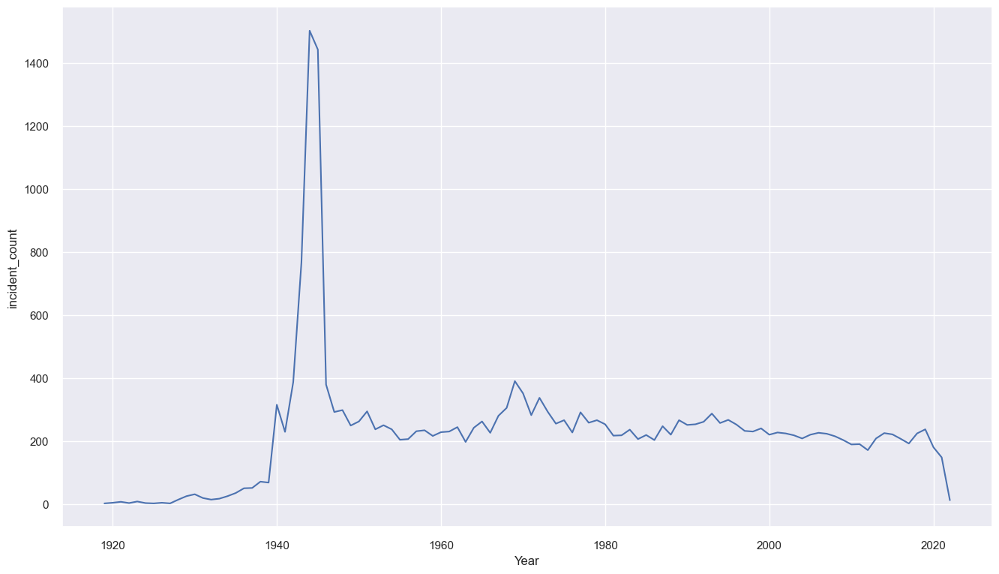

In [48]:
fig, ax = plt.subplots(figsize = (16, 9))
sns.lineplot(incidents_by_year)

In [49]:
incidents_by_year = pd.DataFrame(incidents_by_year)

In [50]:
incidents_by_year = incidents_by_year.reset_index()

In [51]:
incidents_by_year_1970_2022 = incidents_by_year[incidents_by_year['Year'] >= 1970].reset_index()

In [52]:
world_flights

,index,Year,Flights
0,0,1970,9448300.00
1,1,1971,9504500.00
2,51,1972,9634700.00
3,2,1973,9764900.00
4,3,1974,9254900.00
5,4,1975,9244700.00
6,5,1976,9562900.00
7,6,1977,9915900.00
8,7,1978,10183700.00
9,8,1979,10653400.00


In [53]:
incidents_by_year_1970_2022

,index,Year,incident_count
0,51,1970,351
1,52,1971,282
2,53,1972,337
3,54,1973,293
4,55,1974,255
5,56,1975,266
6,57,1976,227
7,58,1977,291
8,59,1978,258
9,60,1979,266


In [54]:
incidents_by_year_1970_2022['Flights'] = world_flights['Flights']

In [55]:
incidents_by_year_1970_2022

,index,Year,incident_count,Flights
0,51,1970,351,9448300.00
1,52,1971,282,9504500.00
2,53,1972,337,9634700.00
3,54,1973,293,9764900.00
4,55,1974,255,9254900.00
5,56,1975,266,9244700.00
6,57,1976,227,9562900.00
7,58,1977,291,9915900.00
8,59,1978,258,10183700.00
9,60,1979,266,10653400.00


In [56]:
incidents_by_year_1970_2022 = incidents_by_year_1970_2022.drop(columns='index')

In [57]:
incidents_by_year_1970_2022['percent of incidents'] = incidents_by_year_1970_2022['incident_count']/incidents_by_year_1970_2022['Flights']

In [58]:
incidents_by_year_1970_2022

,Year,incident_count,Flights,percent of incidents
0,1970,351,9448300.00,3.714954e-05
1,1971,282,9504500.00,2.967016e-05
2,1972,337,9634700.00,3.497774e-05
3,1973,293,9764900.00,3.000543e-05
4,1974,255,9254900.00,2.755297e-05
5,1975,266,9244700.00,2.877324e-05
6,1976,227,9562900.00,2.373757e-05
7,1977,291,9915900.00,2.934681e-05
8,1978,258,10183700.00,2.533460e-05
9,1979,266,10653400.00,2.496855e-05


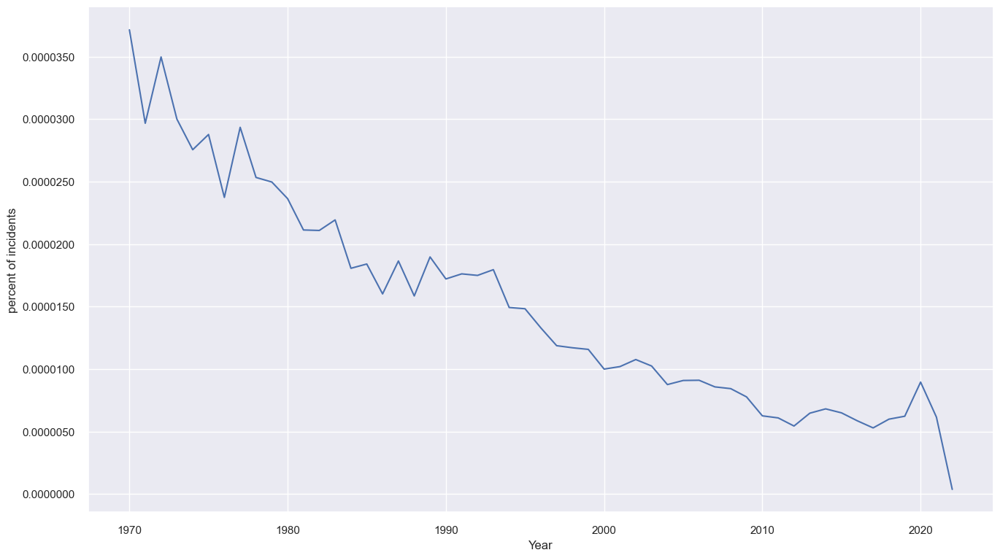

In [59]:
from matplotlib.ticker import FormatStrFormatter
fig, ax = plt.subplots(figsize = (16, 9))
sns.lineplot(incidents_by_year_1970_2022, y='percent of incidents', x='Year')
ax.yaxis.set_major_formatter(FormatStrFormatter('%.7f'))

In [60]:
accidents_by_type = air_disaster[['Year', 'incident_count', 'Incident_Category', 'Total Onboard Fatalities']]

In [61]:
accidents_by_type

,Year,incident_count,Incident_Category,Total Onboard Fatalities
0,2022,1,Accident | repairable-damage,0
1,2022,1,Accident | repairable-damage,0
2,2022,1,Accident | repairable-damage,0
3,2022,1,Accident | hull-loss,0
4,2022,1,"Criminal occurrence (sabotage, shoot down) | h...",0
...,...,...,...,...
23514,1920,1,Accident | hull-loss,0
23515,1920,1,Accident | hull-loss,0
23516,1920,1,Accident | hull-loss,4
23517,1919,1,Accident | hull-loss,14


In [62]:
accidents_by_type= accidents_by_type.groupby('Incident_Category').sum().reset_index()
accidents_by_type= accidents_by_type.sort_values(by='incident_count', ascending=False)

<Axes: xlabel='incident_count', ylabel='Incident_Category'>

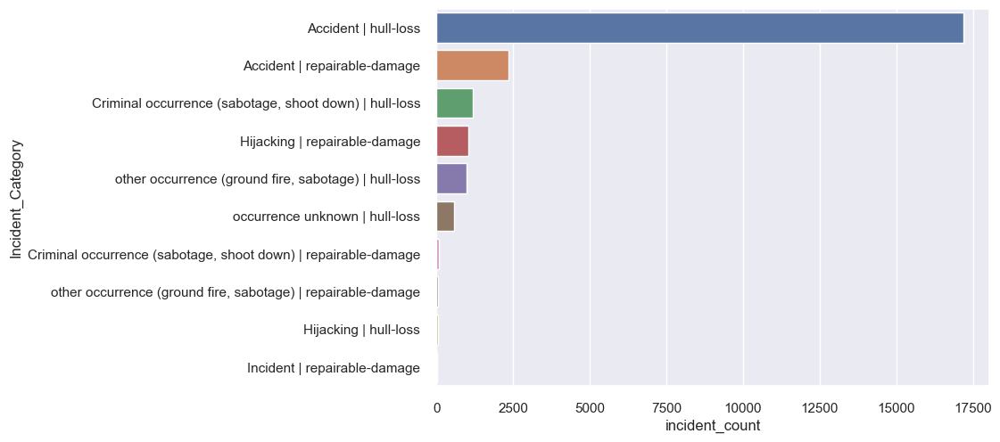

In [63]:
sns.barplot(accidents_by_type, y='Incident_Category', x='incident_count')

<Axes: xlabel='Total Onboard Fatalities', ylabel='Incident_Category'>

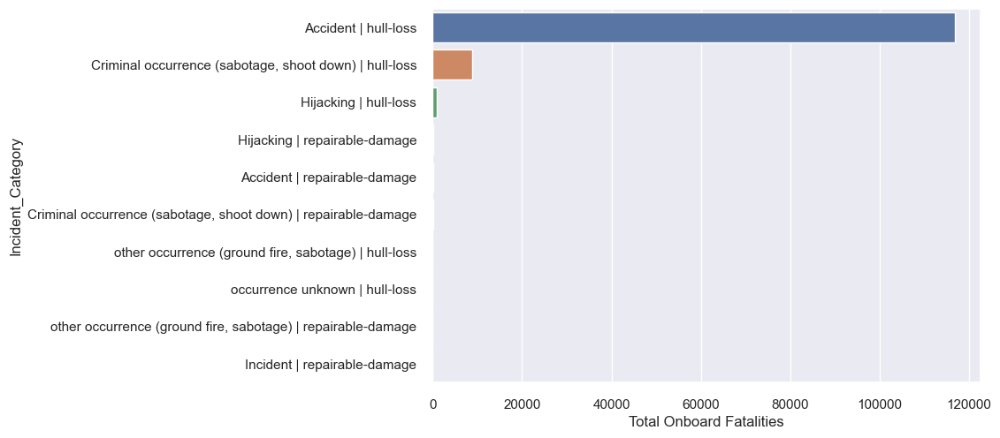

In [64]:
accidents_by_fatalities = accidents_by_type.sort_values(by='Total Onboard Fatalities', ascending=False)
sns.barplot(accidents_by_fatalities, y='Incident_Category', x='Total Onboard Fatalities')

# Pairing down the data set to the 2000s only

In [73]:
air_disaster_2000s = pd.read_csv('../data/Aircraft_Incident_Dataset1.csv')

In [74]:
air_disaster_2000s['Incident_Date'] = pd.to_datetime(air_disaster_2000s['Incident_Date'], format="%m/%d/%Y")
air_disaster_2000s['Year'] = air_disaster_2000s['Incident_Date'].dt.year
air_disaster_2000s = air_disaster_2000s[air_disaster_2000s['Year'] >= 2000]

* Total flights per year

In [75]:
world_flights_2000s = world_flights[world_flights['Year'] >= 2000]

<Axes: xlabel='Year', ylabel='Flights'>

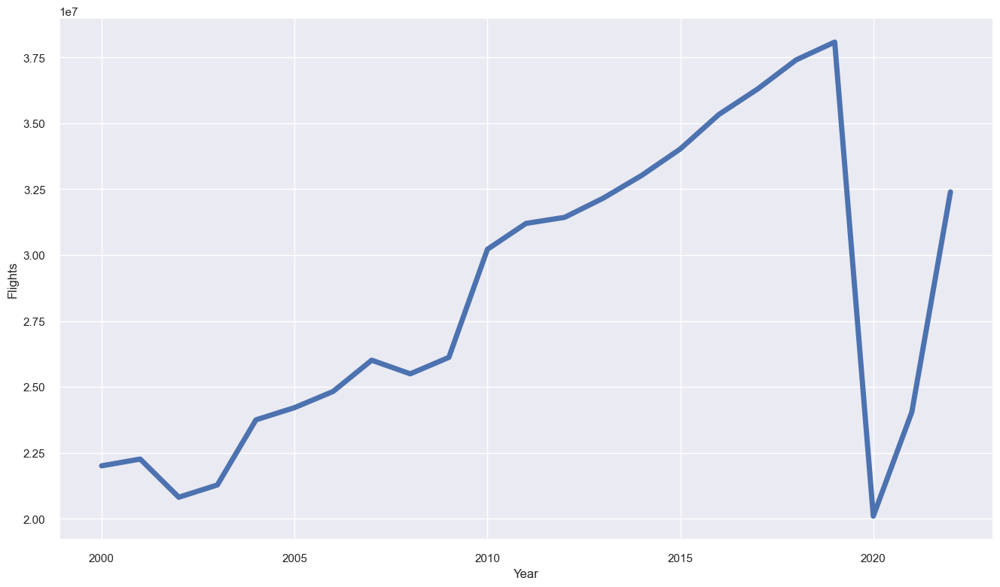

In [76]:
fig, ax = plt.subplots(figsize = (16, 9))
sns.lineplot(world_flights_2000s, y='Flights', x='Year', linewidth = 5)

* Incidents per year

In [77]:
air_disaster_2000s['incident_count'] = 1
incidents_by_year_2000s = air_disaster_2000s.groupby('Year')['incident_count'].sum().reset_index()


In [78]:
incidents_by_year_2000s

,Year,incident_count
0,2000,220
1,2001,227
2,2002,224
3,2003,218
4,2004,208
5,2005,220
6,2006,226
7,2007,223
8,2008,215
9,2009,203


In [79]:
ave_median_incident = incidents_by_year_2000s['incident_count'].mean()

Text(0.5, 1.0, 'Total Incident Counts\n2000-2022')

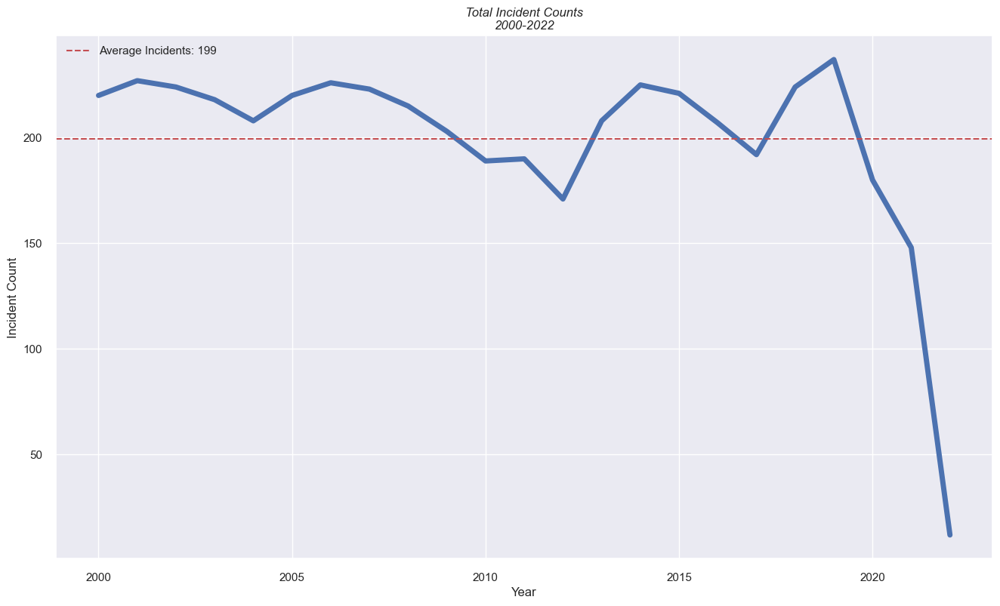

In [80]:


fig, ax = plt.subplots(figsize = (16, 9))
sns.lineplot(incidents_by_year_2000s, y='incident_count', x='Year', color= 'b', linewidth = 5)
ax.axhline(ave_median_incident, color = 'r', label=f'Average Incidents: {ave_median_incident:0.0f}', linestyle='--')
ax.legend()
ax.set_ylabel('Incident Count')
ax.set_title('Total Incident Counts\n2000-2022', style= 'italic')

In [81]:
ave_median_incident = incidents_by_year_2000s['incident_count'].mean()

In [82]:
ave_median_incident

199.47826086956522

Text(0.5, 1.0, 'Total Incident Counts\n2000-2022')

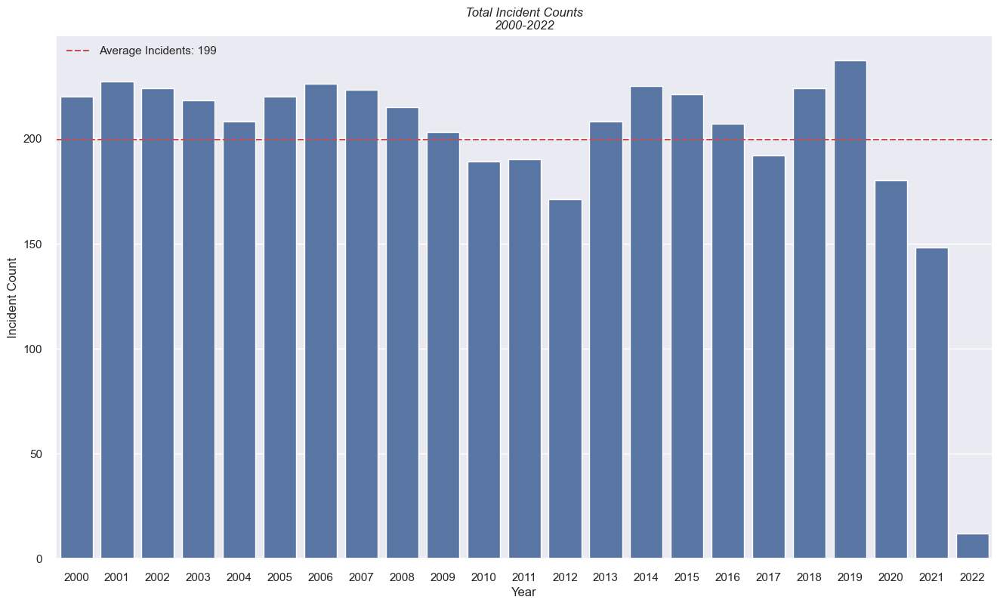

In [83]:

fig, ax = plt.subplots(figsize = (16, 9))
sns.barplot(incidents_by_year_2000s, y='incident_count', x='Year', color= 'b')
ax.axhline(ave_median_incident, color = 'r', label=f'Average Incidents: {ave_median_incident:0.0f}', linestyle='--')
ax.legend()
ax.set_ylabel('Incident Count')
ax.set_title('Total Incident Counts\n2000-2022', style= 'italic')

* percent of incidents per year compared to total flights

In [86]:
#world_flights_2000s=world_flights_2000s.drop(index=54, axis=1)

In [88]:
#world_flights_2000s = world_flights_2000s.drop(columns=['index', 'level_0']).reset_index()

In [91]:
incidents_by_year_2000s['Flights'] = world_flights_2000s['Flights']

incidents_by_year_2000s['percent of incidents'] = incidents_by_year_2000s['incident_count']/incidents_by_year_2000s['Flights']

In [ ]:
inci

In [92]:
incidents_by_year_2000s = pd.DataFrame(incidents_by_year_2000s)
incidents_by_year_2000s = incidents_by_year_2000s.reset_index()
incidents_by_year_2000s['Flights'] = world_flights_2000s['Flights']
incidents_by_year_2000s = incidents_by_year_2000s.drop(columns='index')
incidents_by_year_2000s['percent of incidents'] = incidents_by_year_2000s['incident_count']/incidents_by_year_2000s['Flights']

KeyError: 'y'

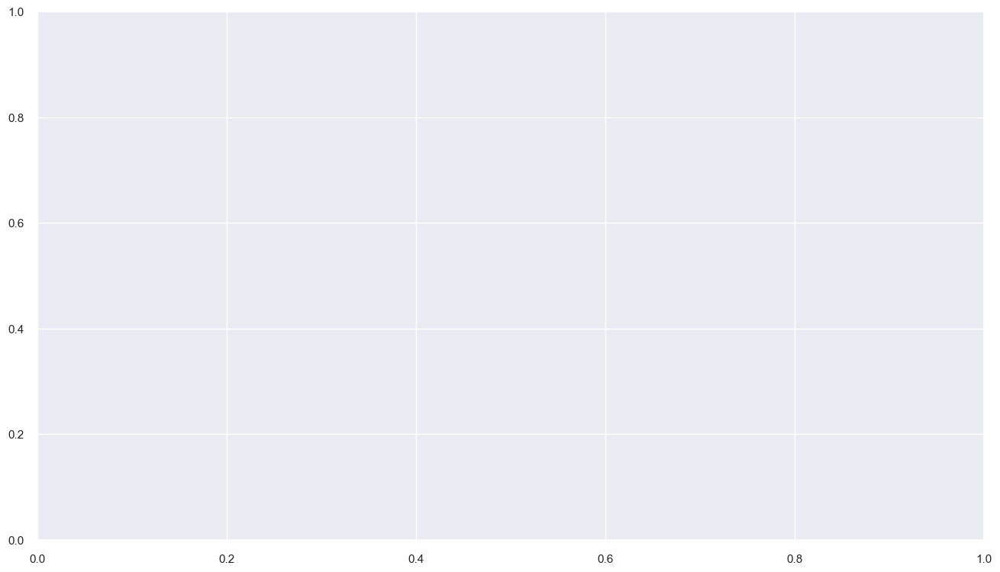

In [94]:
import matplotlib.ticker as mtick

fig, ax = plt.subplots(figsize = (16, 9))
sns.lineplot(incidents_by_year_2000s, y='percent of incidents', x='Year', linewidth = 5)
#ax.yaxis.set_major_formatter(FormatStrFormatter('%7f'))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(decimals=6))
ax.set_ylabel('Percent of Incidents')
ax.set_title('Incidents as a Percent of Total Flights\n2000-2022', style= 'italic')

* Cleaning data to break strings into number fields

In [ ]:
onboard_split = []
for x in air_disaster_2000s['Onboard_Total']:
    onboard_split.append(x.split('/'))

occupants1 = []

for list in onboard_split:
    occupants1.append(list[1])

list_occupants = []

for list in occupants1:
    list_occupants.append(list.split(':'))
    
num_occupants = []

for item in list_occupants:
    num_occupants.append(item[1])

In [ ]:
air_disaster_2000s['Total Occupants'] = occupants(air_disaster_2000s, 'Onboard_Total', 1)

In [ ]:
air_disaster_2000s['Total Passengers'] = occupants(air_disaster_2000s, 'Onboard_Passengers', 1)
air_disaster_2000s['Total Crew'] = occupants(air_disaster_2000s, 'Onboard_Crew', 1)
air_disaster_2000s['Total Onboard Fatalities'] = occupants(air_disaster_2000s, 'Onboard_Total', 0)
air_disaster_2000s['Total Passenger Fatalities'] = occupants(air_disaster_2000s, 'Onboard_Passengers', 0)
air_disaster_2000s['Total Crew Fatalities'] = occupants(air_disaster_2000s, 'Onboard_Crew', 0)

In [ ]:
air_disaster_2000s

,Incident_Date,Aircaft_Model,Aircaft_Registration,Aircaft_Operator,Aircaft_Nature,Incident_Category,Incident_Cause(es),Incident_Location,Aircaft_Damage_Type,Date,...,Ground_Casualties,Collision_Casualties,Year,incident_count,Total Occupants,Total Passengers,Total Crew,Total Onboard Fatalities,Total Passenger Fatalities,Total Crew Fatalities
0,2022-01-03,British Aerospace 4121 Jetstream 41,ZS-NRJ,SA Airlink,Domestic Non Scheduled Passenger,Accident | repairable-damage,"Airplane - Engines, Airplane - Engines - Prop/...",near Venetia Mine...,Substantial,Monday 3 January 2022,...,NaN,NaN,2022,1,7,4,3,0,0,0
1,2022-01-04,British Aerospace 3101 Jetstream 31,HR-AYY,LANHSA,Domestic Scheduled Passenger,Accident | repairable-damage,"Airplane - Undercarriage, Airplane - Undercarr...",Roatán-Juan ...,Substantial,Tuesday 4 January 2022,...,NaN,NaN,2022,1,19,0,0,0,0,0
2,2022-01-05,Boeing 737-4H6,EP-CAP,Caspian Airlines,Domestic Scheduled Passenger,Accident | repairable-damage,"Airplane - Undercarriage, Airplane - Undercarr...",Isfahan-Shah...,Substantial,Wednesday 5 January 2022,...,NaN,NaN,2022,1,116,0,0,0,0,0
3,2022-01-08,Tupolev Tu-204-100C,RA-64032,"Cainiao, opb Aviastar-TU",Cargo,Accident | hull-loss,"Cargo - Fire/smoke, Result - Damaged on the gr...",Hangzhou-Xia...,Destroyed,Saturday 8 January 2022,...,NaN,NaN,2022,1,8,0,8,0,0,0
4,2022-01-12,Beechcraft 200 Super King Air,NaN,private,Illegal Flight,"Criminal occurrence (sabotage, shoot down) | h...",Result - Damaged on the ground,"Machakilha, ...",Damaged beyond repair,Wednesday 12 January 2022,...,NaN,NaN,2022,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4583,2000-12-23,McDonnell Douglas DC-10-10,N132AA,"American Airlines, op.for Hawaiian Airlines",International Scheduled Passenger,Accident | repairable-damage,Result - Runway excursion,Papeete-Faaa...,Substantial,Saturday 23 December 2000,...,NaN,NaN,2000,1,154,139,15,0,0,0
4584,2000-12-23,Beechcraft 200 Super King Air,VP-BBK,Videovision Broadcast,Domestic Non Scheduled Passenger,Accident | hull-loss,Result - Loss of control,near Blackbushe A...,Damaged beyond repair,Saturday 23 December 2000,...,NaN,NaN,2000,1,5,4,1,5,4,1
4585,2000-12-29,British Aerospace 4101 Jetstream 41,N323UE,"United Express, opb Atlantic Coast Airlines",Domestic Scheduled Passenger,Accident | hull-loss,Result - Runway excursion,Charlottesvi...,Substantial,Friday 29 December 2000,...,NaN,NaN,2000,1,18,15,3,0,0,0
4586,2000-12-29,Boeing 747-436,G-BNLM,British Airways,International Scheduled Passenger,Hijacking | repairable-damage,Result - Hijacking - Hijacker(s) overpowered b...,Nairobi-Jomo...,NaN,Friday 29 December 2000,...,NaN,NaN,2000,1,398,379,19,0,0,0


* breaking down incidents by phase

Text(0.5, 1.0, 'Total Incidents by Aircraft Phase\n2000-2022')

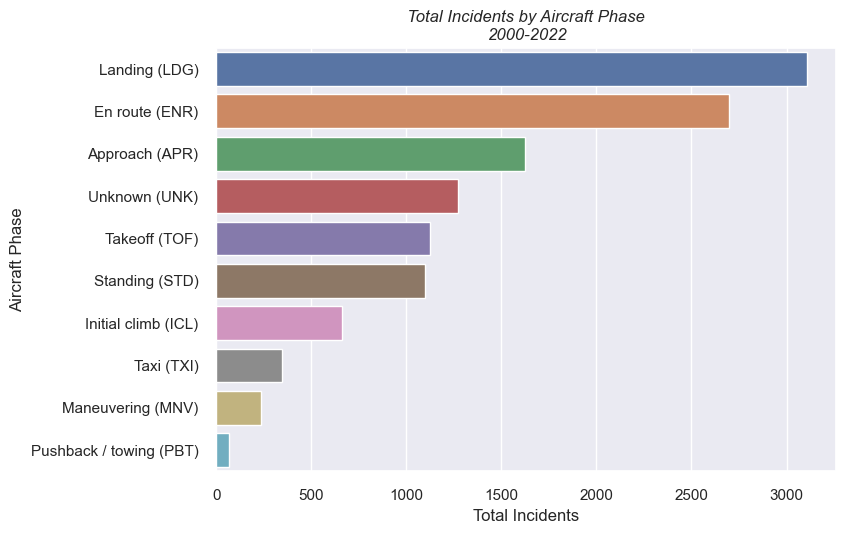

In [ ]:
incidents_by_phase_2000s = pd.DataFrame(air_disaster_2000s['Aircraft_Phase'].value_counts()).reset_index()

fig, ax = plt.subplots()
sns.barplot(incidents_by_phase, y='Aircraft_Phase', x='count')
ax.set_ylabel('Aircraft Phase')
ax.set_xlabel('Total Incidents')
ax.set_title('Total Incidents by Aircraft Phase\n2000-2022', style= 'italic')
#ax.set_title('Total Incident Counts\n2000-2022', style= 'italic')

<Axes: xlabel='Percent of total', ylabel='Aircraft_Phase'>

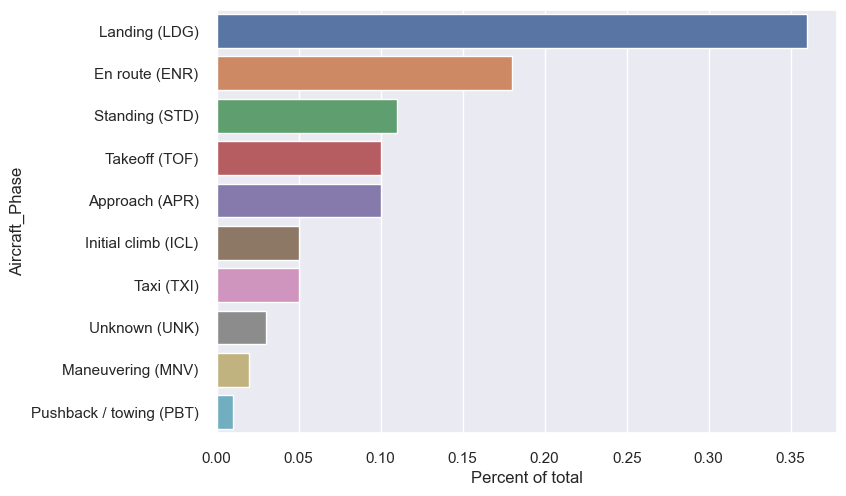

In [ ]:
percent =  []

for count in incidents_by_phase_2000s['count']:
    percent.append(f"{(count / (incidents_by_phase_2000s['count'].sum())):.2f}")

incidents_by_phase_2000s['Percent of total'] = percent
incidents_by_phase_2000s['Percent of total'] = incidents_by_phase_2000s['Percent of total'].astype(float)

sns.barplot(incidents_by_phase_2000s, y='Aircraft_Phase', x='Percent of total')

* Breaking down by type of incident

In [ ]:
accidents_by_type_2000s = air_disaster_2000s[['Year', 'incident_count', 'Incident_Category', 'Total Onboard Fatalities']]
accidents_by_type_2000s= accidents_by_type_2000s.groupby('Incident_Category').sum().reset_index()
accidents_by_type_2000s= accidents_by_type_2000s.sort_values(by='incident_count', ascending=False)

<Axes: xlabel='incident_count', ylabel='Incident_Category'>

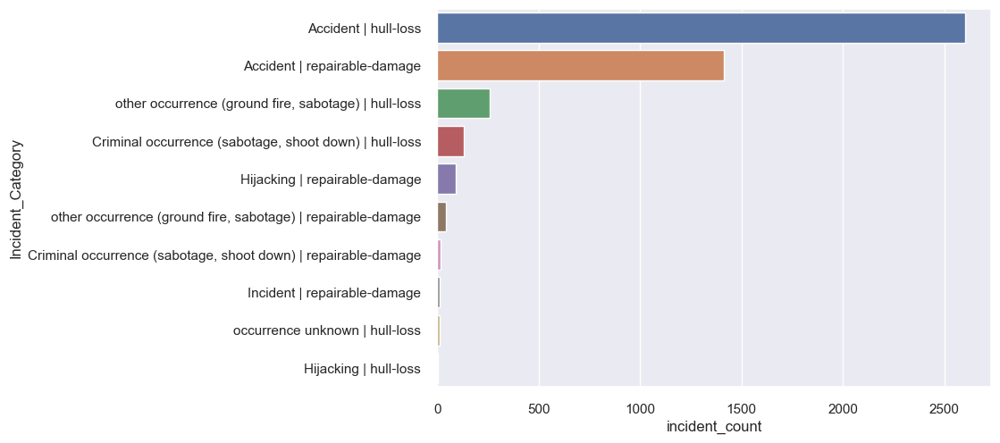

In [ ]:
sns.barplot(accidents_by_type_2000s, y='Incident_Category', x='incident_count')

<Axes: xlabel='Total Onboard Fatalities', ylabel='Incident_Category'>

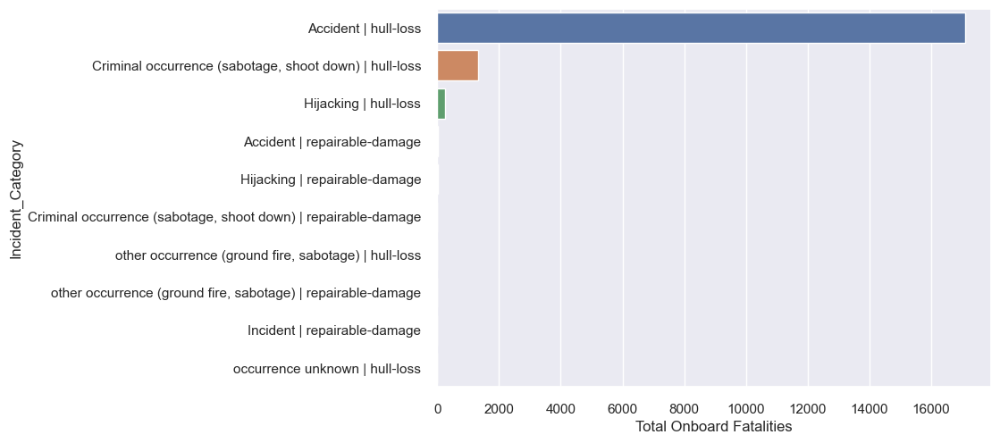

In [ ]:
accidents_by_fatalities_2000s = accidents_by_type_2000s.sort_values(by='Total Onboard Fatalities', ascending=False)
sns.barplot(accidents_by_fatalities_2000s, y='Incident_Category', x='Total Onboard Fatalities')

In [ ]:
air_disaster_2000s

,Incident_Date,Aircaft_Model,Aircaft_Registration,Aircaft_Operator,Aircaft_Nature,Incident_Category,Incident_Cause(es),Incident_Location,Aircaft_Damage_Type,Date,...,Ground_Casualties,Collision_Casualties,Year,incident_count,Total Occupants,Total Passengers,Total Crew,Total Onboard Fatalities,Total Passenger Fatalities,Total Crew Fatalities
0,2022-01-03,British Aerospace 4121 Jetstream 41,ZS-NRJ,SA Airlink,Domestic Non Scheduled Passenger,Accident | repairable-damage,"Airplane - Engines, Airplane - Engines - Prop/...",near Venetia Mine...,Substantial,Monday 3 January 2022,...,NaN,NaN,2022,1,7,4,3,0,0,0
1,2022-01-04,British Aerospace 3101 Jetstream 31,HR-AYY,LANHSA,Domestic Scheduled Passenger,Accident | repairable-damage,"Airplane - Undercarriage, Airplane - Undercarr...",Roatán-Juan ...,Substantial,Tuesday 4 January 2022,...,NaN,NaN,2022,1,19,0,0,0,0,0
2,2022-01-05,Boeing 737-4H6,EP-CAP,Caspian Airlines,Domestic Scheduled Passenger,Accident | repairable-damage,"Airplane - Undercarriage, Airplane - Undercarr...",Isfahan-Shah...,Substantial,Wednesday 5 January 2022,...,NaN,NaN,2022,1,116,0,0,0,0,0
3,2022-01-08,Tupolev Tu-204-100C,RA-64032,"Cainiao, opb Aviastar-TU",Cargo,Accident | hull-loss,"Cargo - Fire/smoke, Result - Damaged on the gr...",Hangzhou-Xia...,Destroyed,Saturday 8 January 2022,...,NaN,NaN,2022,1,8,0,8,0,0,0
4,2022-01-12,Beechcraft 200 Super King Air,NaN,private,Illegal Flight,"Criminal occurrence (sabotage, shoot down) | h...",Result - Damaged on the ground,"Machakilha, ...",Damaged beyond repair,Wednesday 12 January 2022,...,NaN,NaN,2022,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4583,2000-12-23,McDonnell Douglas DC-10-10,N132AA,"American Airlines, op.for Hawaiian Airlines",International Scheduled Passenger,Accident | repairable-damage,Result - Runway excursion,Papeete-Faaa...,Substantial,Saturday 23 December 2000,...,NaN,NaN,2000,1,154,139,15,0,0,0
4584,2000-12-23,Beechcraft 200 Super King Air,VP-BBK,Videovision Broadcast,Domestic Non Scheduled Passenger,Accident | hull-loss,Result - Loss of control,near Blackbushe A...,Damaged beyond repair,Saturday 23 December 2000,...,NaN,NaN,2000,1,5,4,1,5,4,1
4585,2000-12-29,British Aerospace 4101 Jetstream 41,N323UE,"United Express, opb Atlantic Coast Airlines",Domestic Scheduled Passenger,Accident | hull-loss,Result - Runway excursion,Charlottesvi...,Substantial,Friday 29 December 2000,...,NaN,NaN,2000,1,18,15,3,0,0,0
4586,2000-12-29,Boeing 747-436,G-BNLM,British Airways,International Scheduled Passenger,Hijacking | repairable-damage,Result - Hijacking - Hijacker(s) overpowered b...,Nairobi-Jomo...,NaN,Friday 29 December 2000,...,NaN,NaN,2000,1,398,379,19,0,0,0


In [ ]:
air_disaster_2000s['Total Occupants'] = air_disaster_2000s['Total Occupants'].astype(int)

<Axes: xlabel='Total Onboard Fatalities', ylabel='Total Occupants'>

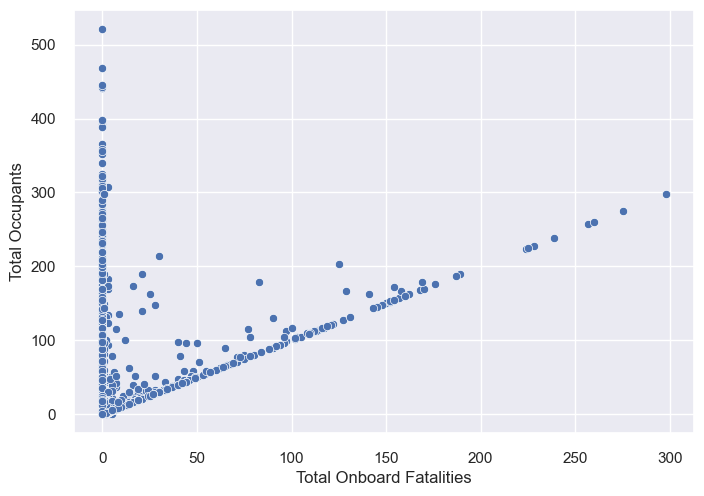

In [ ]:
onboard_fatalities_greater_0 = air_disaster_2000s[air_disaster_2000s['Total Onboard Fatalities'] > 0]
sns.scatterplot(air_disaster_2000s, y='Total Occupants', x='Total Onboard Fatalities')

<Axes: xlabel='Total Onboard Fatalities', ylabel='Total Occupants'>

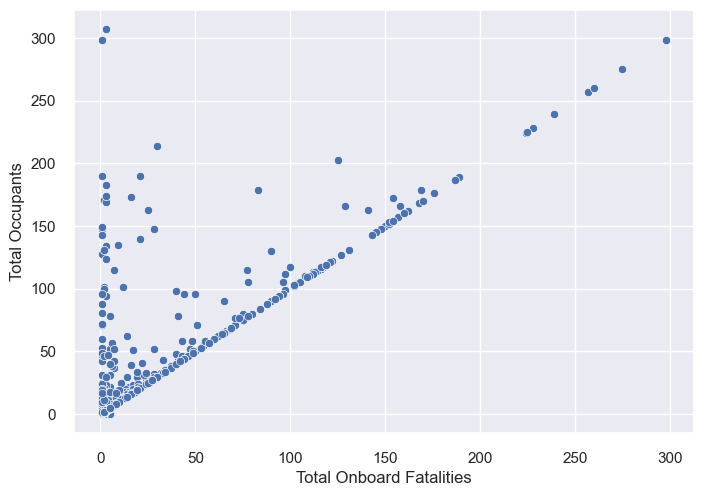

In [ ]:
sns.scatterplot(onboard_fatalities_greater_0, y='Total Occupants', x='Total Onboard Fatalities')

<Axes: xlabel='Total Crew Fatalities', ylabel='Total Crew'>

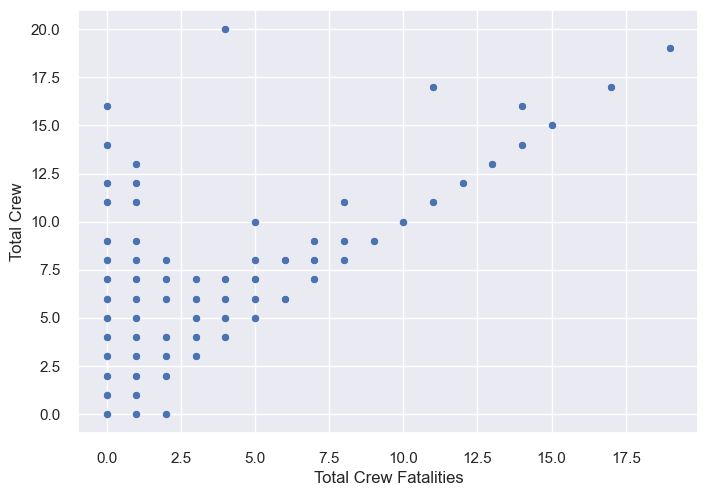

In [ ]:
sns.scatterplot(onboard_fatalities_greater_0, y='Total Crew', x='Total Crew Fatalities')

<Axes: xlabel='Total Passenger Fatalities', ylabel='Total Passengers'>

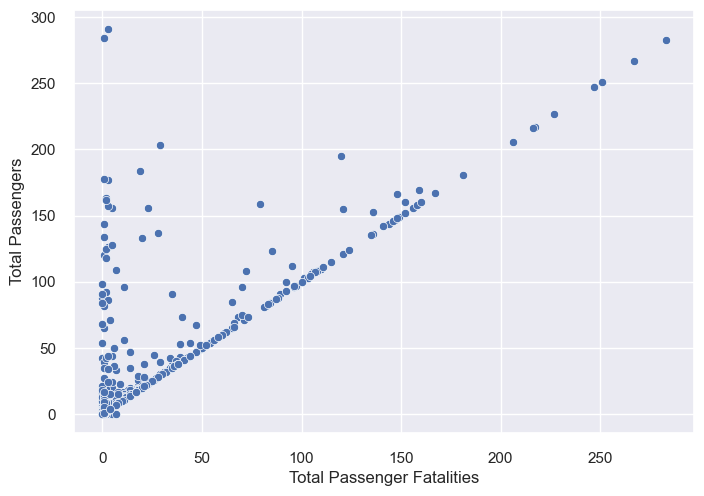

In [ ]:
sns.scatterplot(onboard_fatalities_greater_0, y='Total Passengers', x='Total Passenger Fatalities')

In [ ]:
non_fatal_incidents = air_disaster_2000s[air_disaster_2000s['Total Onboard Fatalities']==0].shape[0]

In [ ]:
fatal_incidents = onboard_fatalities_greater_0.shape[0]

In [ ]:
percent_of_incidents_fatal = fatal_incidents / (fatal_incidents+non_fatal_incidents)
percent_of_incidents_non_fatal = non_fatal_incidents / (fatal_incidents+non_fatal_incidents)
print(f'Percent of non-fatal incidents is: {percent_of_incidents_non_fatal:.1%}')
print(f'Percent of fatal incidents is: {percent_of_incidents_fatal:.1%}')

Percent of non-fatal incidents is: 73.6%
Percent of fatal incidents is: 26.4%


# Percent of non-fatal incidents is: 73.6%
# Percent of fatal incidents is: 26.4%

In [ ]:
onboard_fatalities_greater_0['compare'] = (onboard_fatalities_greater_0['Total Occupants'] == onboard_fatalities_greater_0['Total Onboard Fatalities'])

/var/folders/qw/b5rk3_jd0f71s0ysbqxl07sc0000gn/T/ipykernel_27615/4168687942.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  onboard_fatalities_greater_0['compare'] = (onboard_fatalities_greater_0['Total Occupants'] == onboard_fatalities_greater_0['Total Onboard Fatalities'])


In [ ]:
total_occupant_loss = onboard_fatalities_greater_0['compare'].value_counts()[0]
not_total_occupant_loss = onboard_fatalities_greater_0['compare'].value_counts()[1]
percent_of_total_loss = total_occupant_loss / (total_occupant_loss+not_total_occupant_loss)
percent_of_non_total_loss = not_total_occupant_loss / (total_occupant_loss+not_total_occupant_loss)
print(f'Percent of fatal incidents where some occupants survived: {percent_of_non_total_loss:.1%}')
print(f'Percent of fatal incidents where all occupants were lost: {percent_of_total_loss:.1%}')

Percent of fatal incidents where some occupants survived: 32.7%
Percent of fatal incidents where all occupants were lost: 67.3%


# Percent of fatal incidents where some occupants survived: 32.7%
# Percent of fatal incidents where all occupants were lost: 67.3%

In [ ]:
occupant_loss = np.asarray([total_occupant_loss, not_total_occupant_loss])

In [ ]:
occupant_loss = pd.DataFrame(occupant_loss)
occupant_loss['incidents'] = ['No Survivors', 'Some Survivors']
occupant_loss.columns = ['Number of Incidents', 'Fatal Incidents']
occupant_loss

,Number of Incidents,Fatal Incidents
0,815,No Survivors
1,396,Some Survivors


In [ ]:
some_survivors = occupant_loss[occupant_loss['Fatal Incidents']=='Some Survivors']
no_survivors = occupant_loss[occupant_loss['Fatal Incidents']=='No Survivors']
occupant_loss = occupant_loss.set_index('Fatal Incidents')

In [ ]:
reset = occupant_loss.reset_index()
reset['Number of Incidents']

[Text(0, 0, '815.0%'), Text(0, 0, '396.0%')]

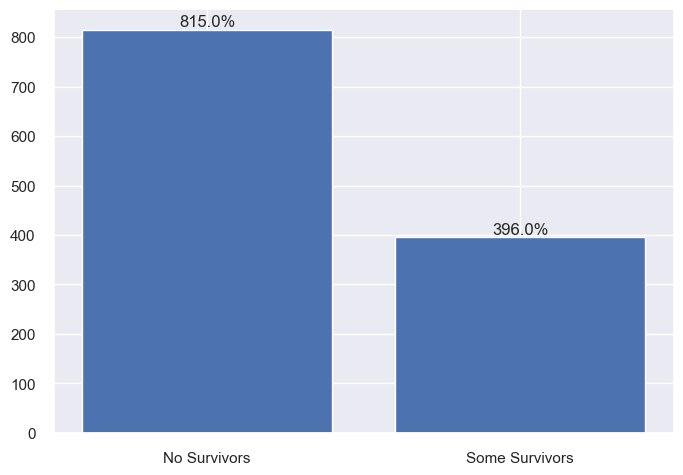

In [ ]:
fig, ax = plt.subplots()

bar_container = ax.bar(reset['Fatal Incidents'], reset['Number of Incidents'])
ax.bar_label(bar_container, fmt='%.1f%%')

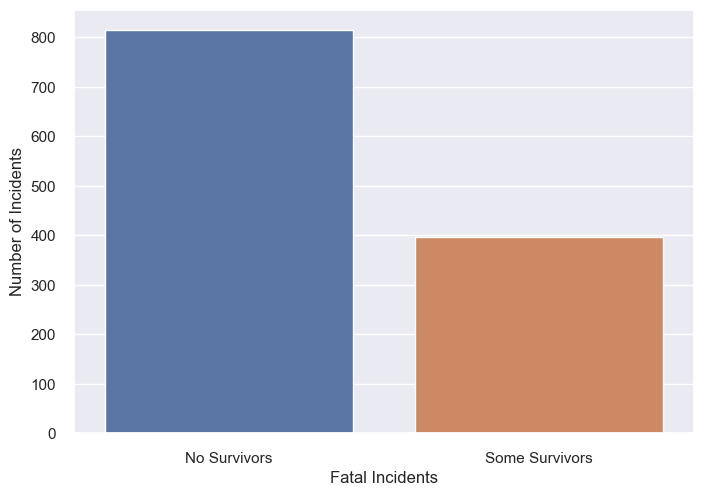

In [ ]:
fig, ax = plt.subplots()
hbars = sns.barplot(occupant_loss, y='Number of Incidents', x=occupant_loss.index)
#ax.bar_label(p, fmt='%.2f%%', label_type='edge')



In [ ]:
occupant_loss = occupant_loss.set_index('Fatal Incidents')
occupant_loss

KeyError: "None of ['Fatal Incidents'] are in the columns"

In [ ]:
occupant_loss['percent'] = [percent_of_total_loss, percent_of_non_total_loss]
occupant_loss

,Number of Incidents,percent
Fatal Incidents,,
No Survivors,815,0.672998
Some Survivors,396,0.327002


In [ ]:
'''colors = ['#5cb85c', '#5bc0de']

# plot with annotations is probably easier
p1 = occupant_loss.plot(kind='bar', color=colors, figsize=(20, 8), rot=0, ylabel='Percentage', title="The percentage of the respondents' interest in the different data science Area")

for p in p1.containers:
    p1.bar_label(p, fmt='%.1f%%', label_type='edge')'''

'colors = [\'#5cb85c\', \'#5bc0de\']\n\n# plot with annotations is probably easier\np1 = occupant_loss.plot(kind=\'bar\', color=colors, figsize=(20, 8), rot=0, ylabel=\'Percentage\', title="The percentage of the respondents\' interest in the different data science Area")\n\nfor p in p1.containers:\n    p1.bar_label(p, fmt=\'%.1f%%\', label_type=\'edge\')'

In [ ]:
overall_incidents = np.asarray([fatal_incidents, non_fatal_incidents])
overall_incidents = pd.DataFrame(overall_incidents)
overall_incidents['incidents'] = ['Fatal', 'Non Fatal']
overall_incidents.columns = ['Number of Incidents', 'Incidents']
overall_incidents

,Number of Incidents,Incidents
0,1211,Fatal
1,3377,Non Fatal


<Axes: xlabel='Incidents', ylabel='Number of Incidents'>

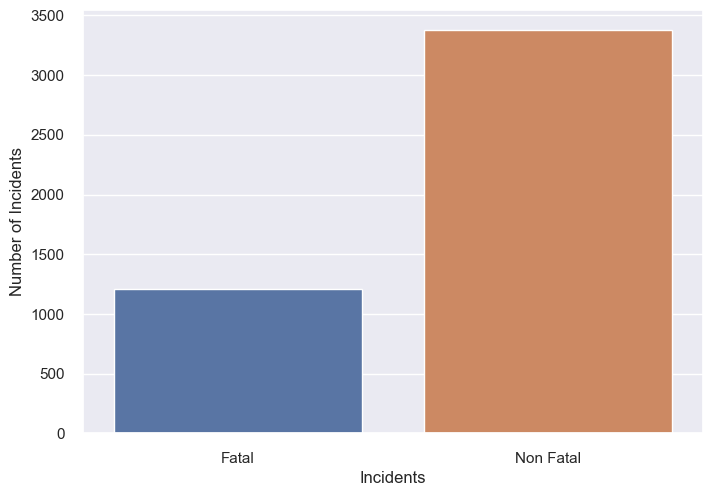

In [ ]:
sns.barplot(overall_incidents, y='Number of Incidents', x='Incidents')

In [ ]:
fatal_incidents_cleaned = onboard_fatalities_greater_0.drop(columns=['Incident_Location', 'Date', 'Collision_Casualties', 'Aircaft_Registration', 'Arit', 'Time'
                                                                     ,'Onboard_Crew', 'Onboard_Passengers', 'Onboard_Total', 'Fatalities', 'Ground_Casualties'
                                                                     ,'Aircaft_First_Flight', 'Destination_Airport', 'Departure_Airport'])

In [ ]:
incidents_cleaned = air_disaster_2000s.drop(columns=['Incident_Location', 'Date', 'Collision_Casualties', 'Aircaft_Registration', 'Arit', 'Time'
                                                                     ,'Onboard_Crew', 'Onboard_Passengers', 'Onboard_Total', 'Fatalities', 'Ground_Casualties'
                                                                     ,'Aircaft_First_Flight', 'Destination_Airport', 'Departure_Airport'])

In [ ]:
fatal_incidents_cleaned

,Incident_Date,Aircaft_Model,Aircaft_Operator,Aircaft_Nature,Incident_Category,Incident_Cause(es),Aircaft_Damage_Type,Aircaft_Engines,Aircraft_Phase,Year,incident_count,Total Occupants,Total Passengers,Total Crew,Total Onboard Fatalities,Total Passenger Fatalities,Total Crew Fatalities,compare
9,2022-02-11,Antonov An-2R,Kamchatsky Krechet,Cargo,Accident | hull-loss,Info-Unavailable,Destroyed,NaN,Initial climb (ICL),2022,1,2,0,2,2,0,2,True
14,2021-01-09,Boeing 737-524 (WL),Sriwijaya Air,Domestic Scheduled Passenger,Accident | hull-loss,Result - Loss of control,Destroyed,2 CFMI CFM56-3B1,En route (ENR),2021,1,62,56,6,62,56,6,True
15,2021-01-09,Cessna 560 Citation V,SX Transport LLC,Unknown,Accident | hull-loss,"Result - Loss of control, Result - Loss of con...",Destroyed,2 Pratt Whitney Canada JT15D-5A,En route (ENR),2021,1,1,0,1,1,0,1,True
16,2021-01-12,Harbin Y-12-II,Kenyan AF,Military,Accident | hull-loss,Info-Unavailable,Damaged beyond repair,NaN,Unknown (UNK),2021,1,4,2,2,4,2,2,True
25,2021-01-01,Antonov An-2,KPAAF,Military,Accident | hull-loss,Result - Loss of control,Damaged beyond repair,NaN,Initial climb (ICL),2021,1,5,0,5,5,0,5,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4572,2000-12-01,Antonov An-24,Unknown,Unknown,Hijacking | repairable-damage,Result - Hijacking - Hijacker(s) overpowered b...,Minor,NaN,En route (ENR),2000,1,17,0,0,1,1,0,False
4576,2000-12-11,Embraer EMB-110P1K Bandeirante,Gabonese AF,Military,Accident | hull-loss,Unknown - Missing,Missing,2 Pratt Whitney Canada PT6A-34,Unknown (UNK),2000,1,3,1,2,3,1,2,True
4580,2000-12-20,Curtiss C-46A-45-CU Commando,Everts Air Fuel,Cargo,Accident | hull-loss,"ATC & navigation - VFR flight in IMC, Result -...",Destroyed,2 Pratt Whitney R-2800,En route (ENR),2000,1,2,0,2,2,0,2,True
4582,2000-12-22,Beechcraft B200 Super King Air,Mountain Air Service,Private,Accident | hull-loss,"Result - CFIT - Hill, mountain",Damaged beyond repair,2 Pratt Whitney Canada PT6A-42,Approach (APR),2000,1,2,1,1,2,1,1,True


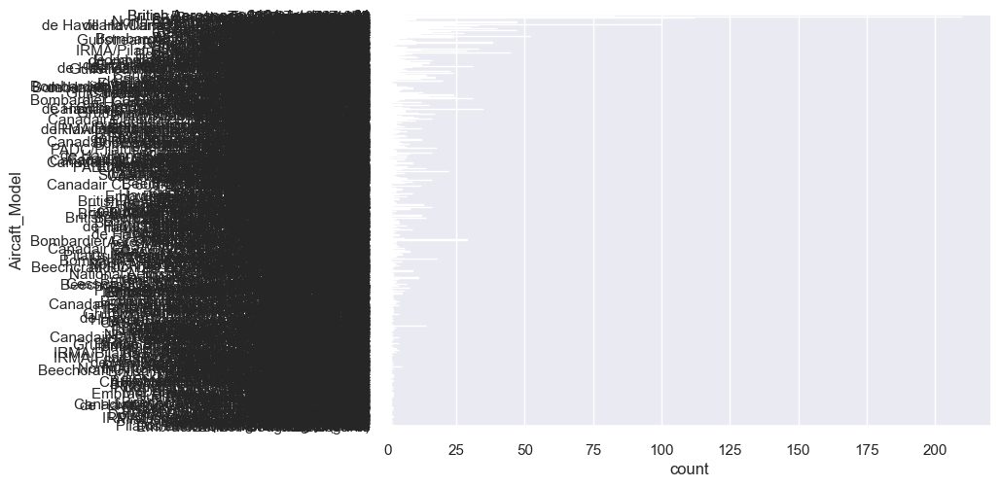

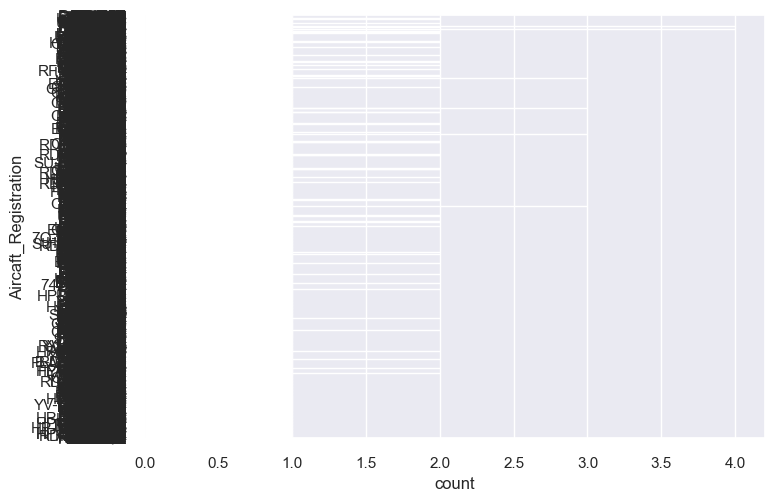

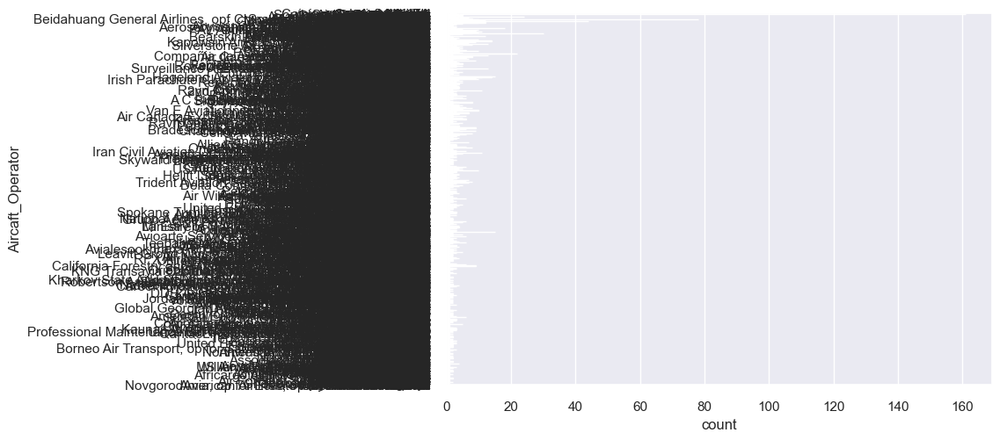

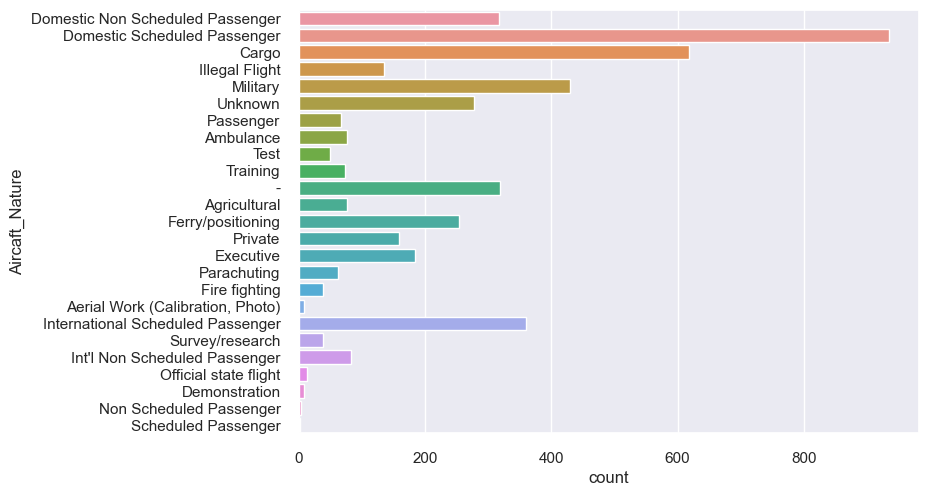

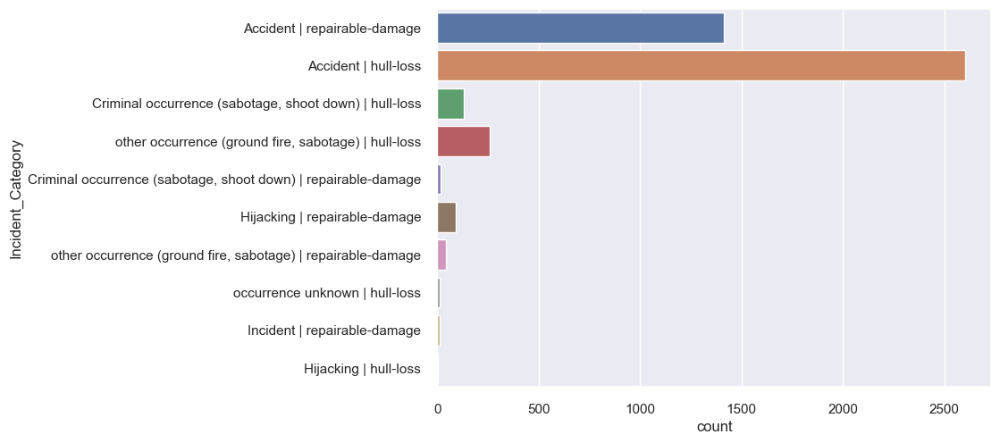

...

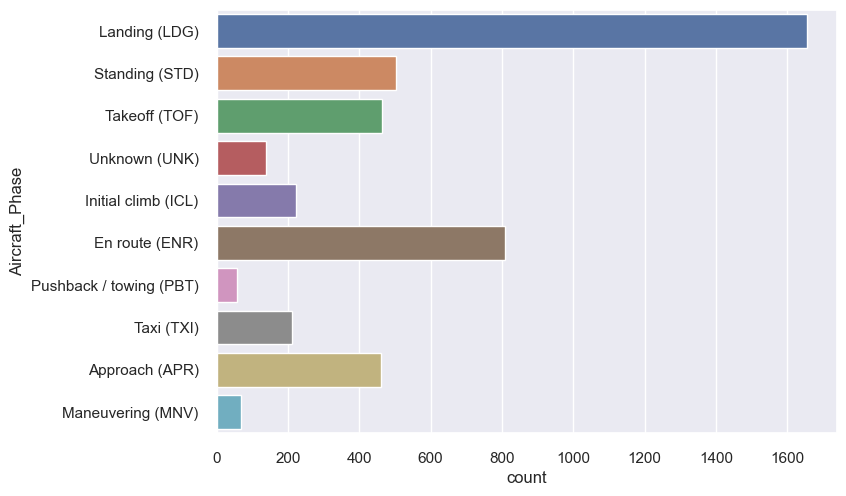

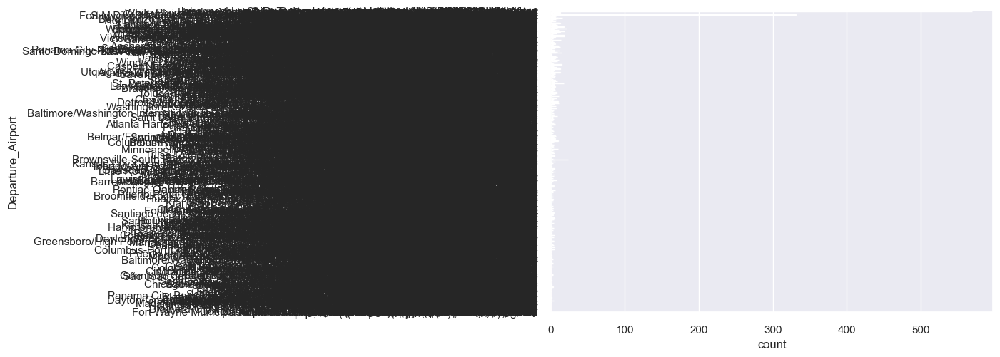

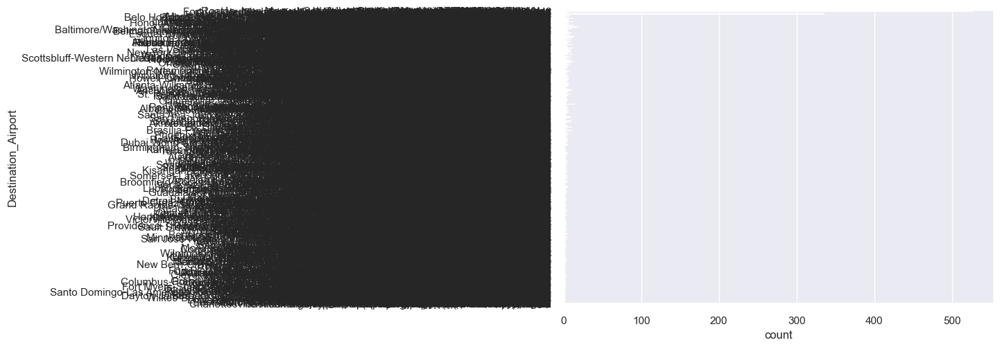

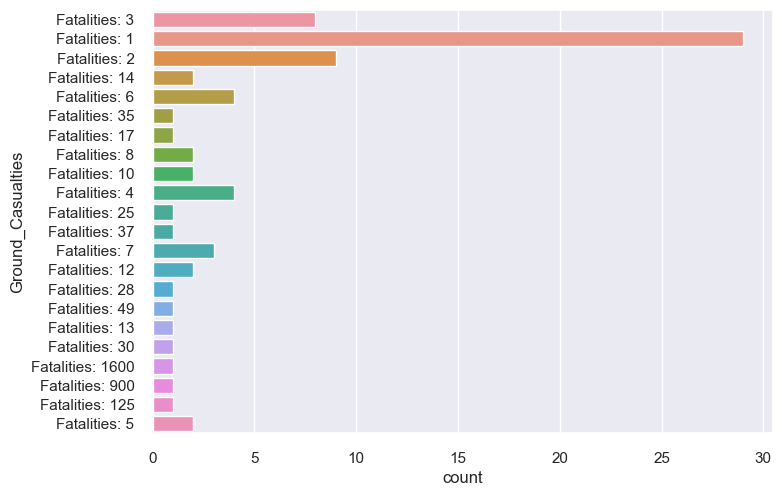

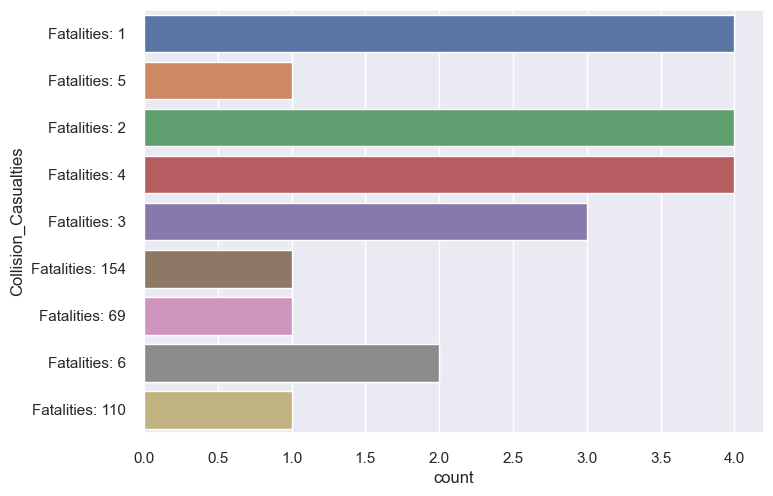

In [ ]:
for column in air_disaster_2000s.select_dtypes(include='object'):
    if air_disaster_2000s[column].nunique() > 1:
        sns.countplot(y=column, data=air_disaster_2000s)
        plt.show()

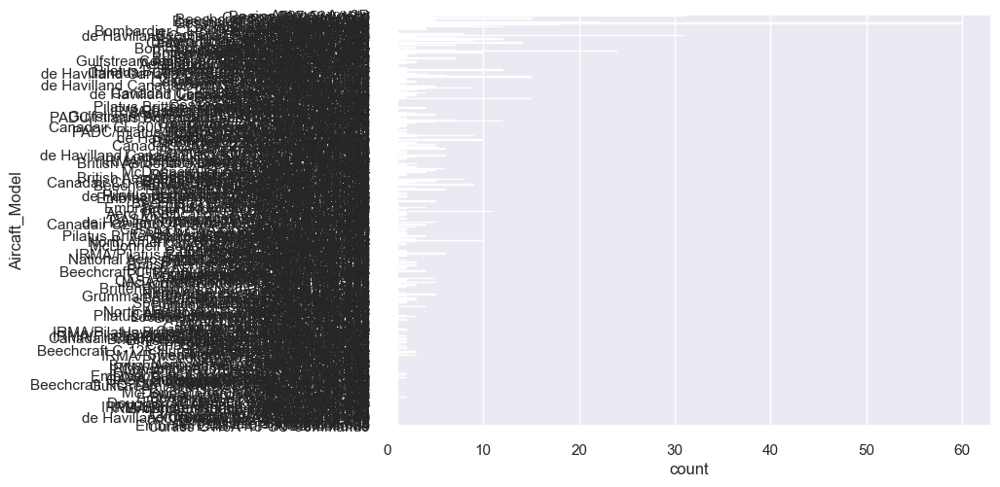

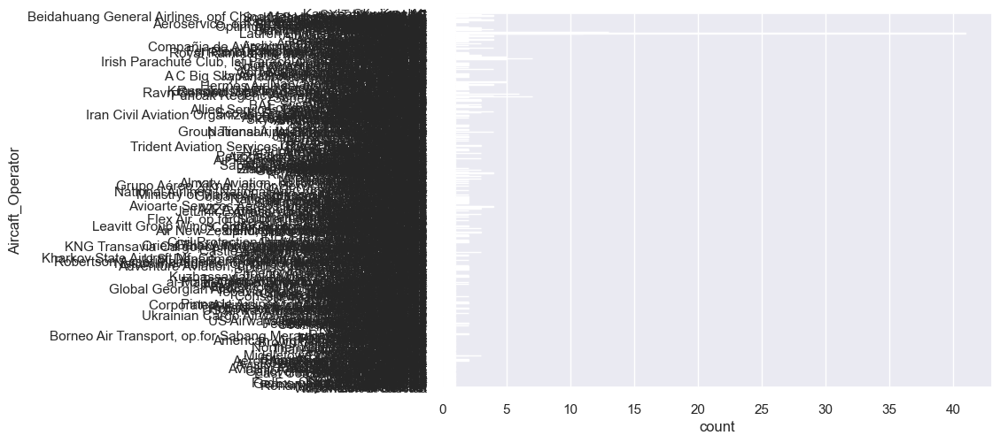

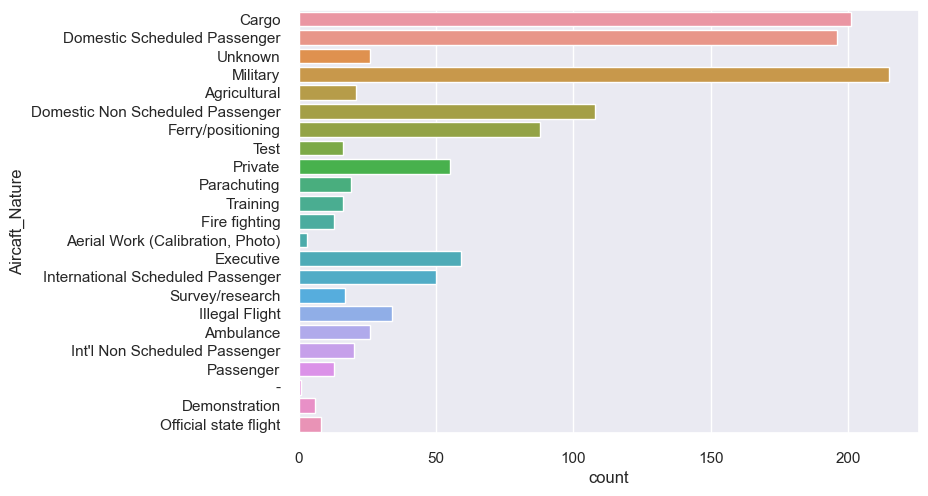

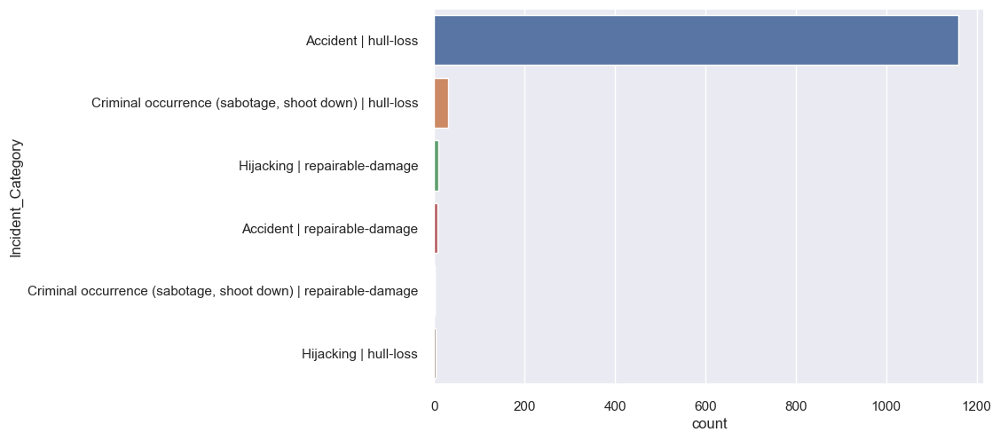

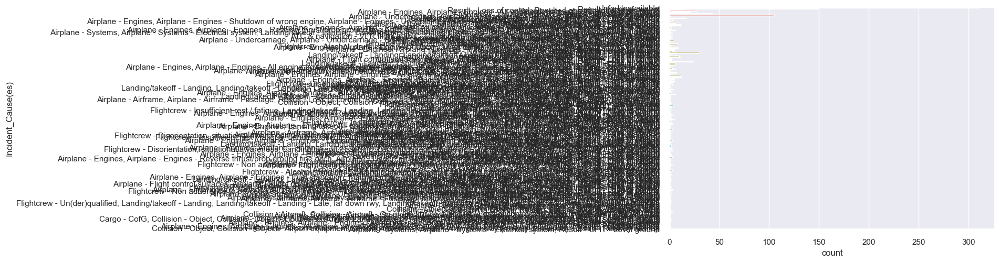

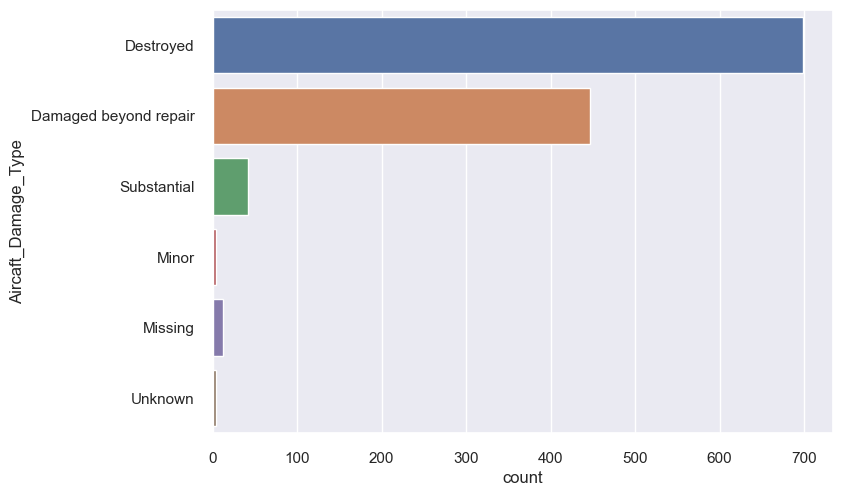

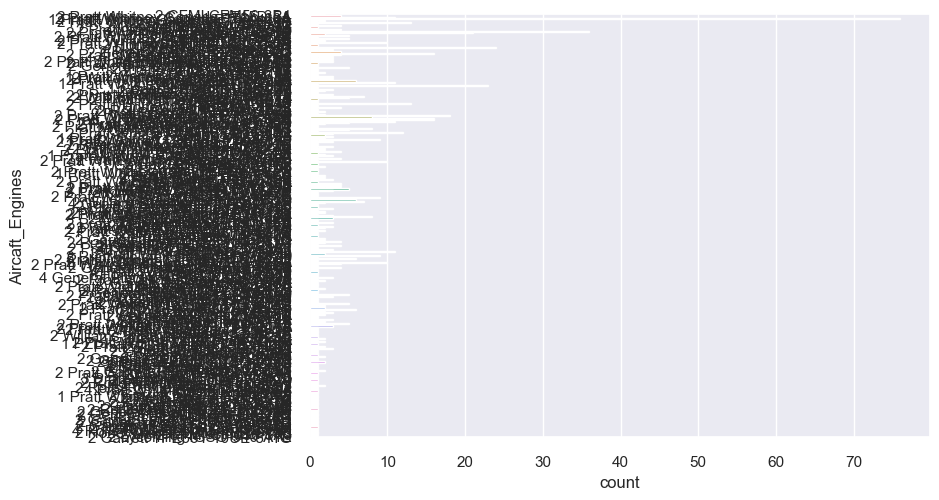

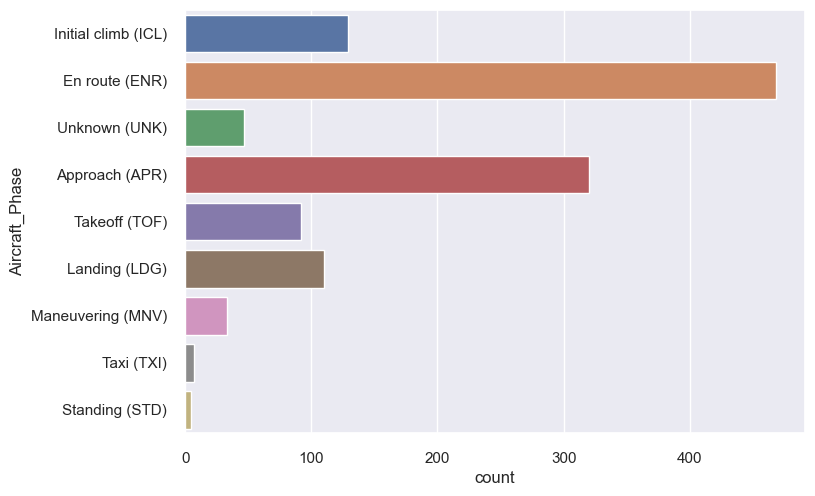

In [ ]:
for column in fatal_incidents_cleaned.select_dtypes(include='object'):
    if fatal_incidents_cleaned[column].nunique() > 1:
        sns.countplot(y=column, data=fatal_incidents_cleaned)
        plt.show()

In [ ]:
fatal_incidents_cleaned['Aircaft_Model'].value_counts()

Aircaft_Model
Cessna 208B Grand Caravan                   60
de Havilland Canada DHC-6 Twin Otter 300    31
Antonov An-2R                               31
Beechcraft 200 Super King Air               24
Antonov An-26                               22
                                            ..
Curtiss C-46F-1-CU Commando                  1
Boeing 737-236A                              1
ATR 72-201                                   1
Beechcraft B300 Super King Air 350           1
Curtiss C-46A-45-CU Commando                 1
Name: count, Length: 510, dtype: int64

In [ ]:
air_disaster_2000s['Aircaft_Model'].value_counts().head(20)

Aircaft_Model
Cessna 208B Grand Caravan                   210
Antonov An-2R                               112
de Havilland Canada DHC-6 Twin Otter 300    100
Beechcraft 200 Super King Air                83
Cessna 208 Caravan I                         52
Antonov An-2                                 47
Learjet 35A                                  47
Swearingen SA227-AC Metro III                45
Antonov An-26                                43
Beechcraft B200 Super King Air               40
Cessna 208B Super Cargomaster                38
Let L-410UVP                                 35
Beechcraft A100 King Air                     33
Antonov An-2T                                33
de Havilland Canada DHC-8-402Q Dash 8        31
Ilyushin Il-76TD                             31
Fokker 100                                   30
Antonov An-12BP                              29
Beechcraft B200 King Air                     29
Beechcraft 1900D                             28
Name: count, dtype: int64

In [ ]:
Cessna_208B_Grand_Caravan = fatal_incidents_cleaned[fatal_incidents_cleaned['Aircaft_Model'] == 'Cessna 208B Grand Caravan']
de_Havilland_Canada_DHC6 = fatal_incidents_cleaned[fatal_incidents_cleaned['Aircaft_Model'] == 'de Havilland Canada DHC-6 Twin Otter 300']

array([[<Axes: title={'center': 'Incident_Date'}>,
        <Axes: title={'center': 'Year'}>,
        <Axes: title={'center': 'incident_count'}>],
       [<Axes: title={'center': 'Total Occupants'}>,
        <Axes: title={'center': 'Total Passengers'}>,
        <Axes: title={'center': 'Total Crew'}>],
       [<Axes: title={'center': 'Total Onboard Fatalities'}>,
        <Axes: title={'center': 'Total Passenger Fatalities'}>,
        <Axes: title={'center': 'Total Crew Fatalities'}>]], dtype=object)

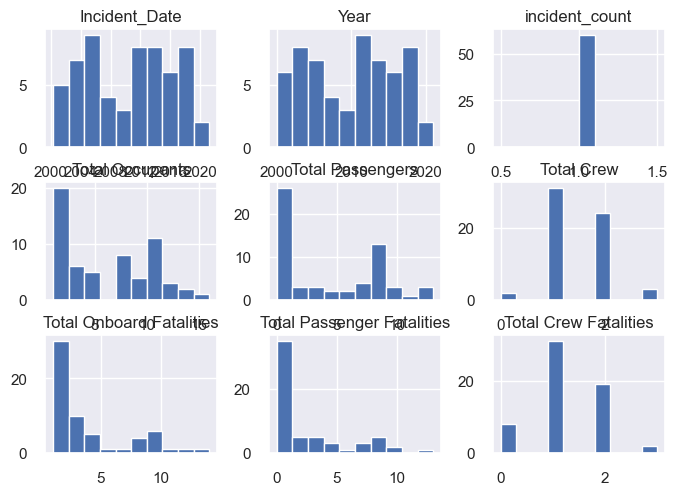

In [ ]:
Cessna_208B_Grand_Caravan.hist()

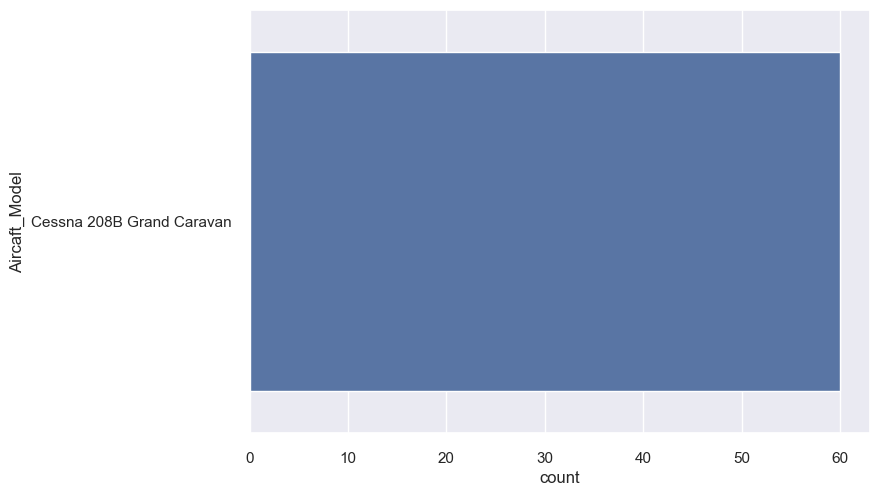

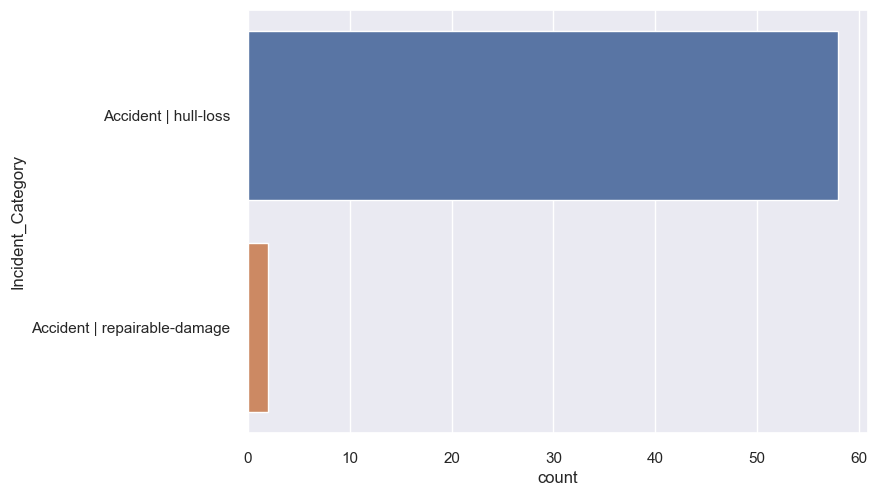

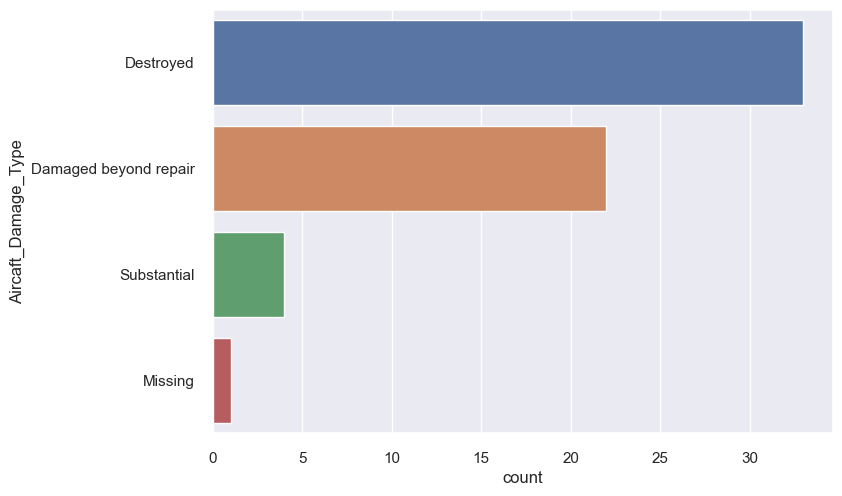

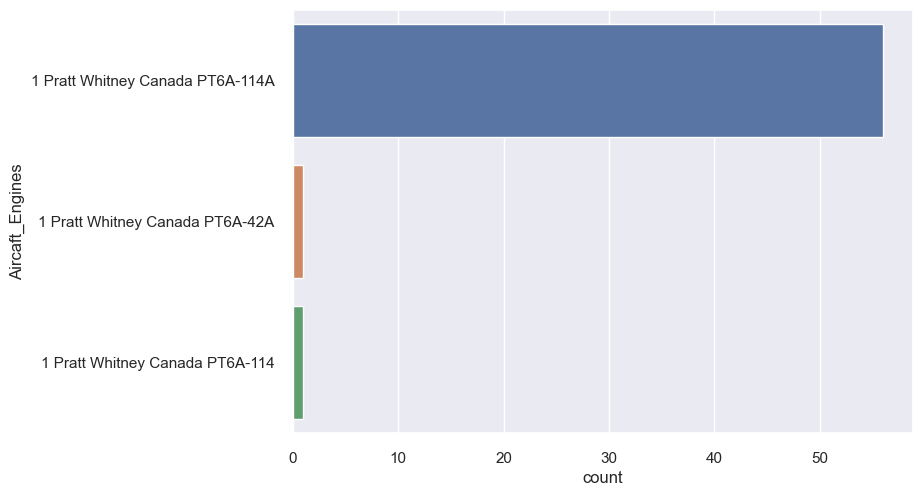

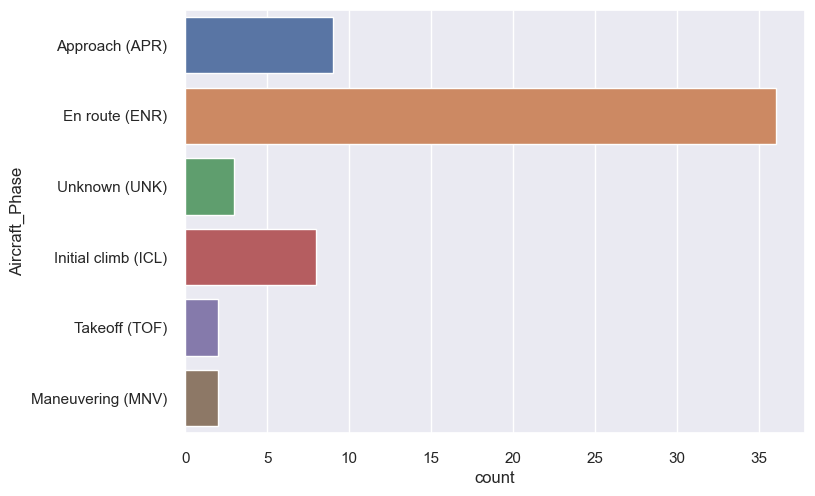

In [ ]:
for column in Cessna_208B_Grand_Caravan.select_dtypes(include='object'):
    if Cessna_208B_Grand_Caravan[column].nunique() < 10:
        sns.countplot(y=column, data=Cessna_208B_Grand_Caravan)
        plt.show()

In [ ]:
Cessna_208B_Grand_Caravan['compare'].value_counts()

compare
True     40
False    20
Name: count, dtype: int64

In [ ]:
de_Havilland_Canada_DHC6['compare'].value_counts()

compare
True     22
False     9
Name: count, dtype: int64

In [ ]:
Cessna_208B_Grand_Caravan.head(0)

,Incident_Date,Aircaft_Model,Aircaft_Operator,Aircaft_Nature,Incident_Category,Incident_Cause(es),Aircaft_Damage_Type,Aircaft_Engines,Aircraft_Phase,Year,incident_count,Total Occupants,Total Passengers,Total Crew,Total Onboard Fatalities,Total Passenger Fatalities,Total Crew Fatalities,compare


In [ ]:
Cessna_208B_Grand_Caravan.groupby('compare').agg({'Total Occupants': 'sum', 'Total Onboard Fatalities': 'sum'})

,Total Occupants,Total Onboard Fatalities
compare,,
False,176,50
True,186,186


In [ ]:
de_Havilland_Canada_DHC6.groupby('compare').agg({'Total Occupants': 'sum', 'Total Onboard Fatalities': 'sum'})

,Total Occupants,Total Onboard Fatalities
compare,,
False,107,50
True,231,231


In [ ]:
incidents_cleaned.head()

,Incident_Date,Aircaft_Model,Aircaft_Operator,Aircaft_Nature,Incident_Category,Incident_Cause(es),Aircaft_Damage_Type,Aircaft_Engines,Aircraft_Phase,Year,incident_count,Total Occupants,Total Passengers,Total Crew,Total Onboard Fatalities,Total Passenger Fatalities,Total Crew Fatalities
0,2022-01-03,British Aerospace 4121 Jetstream 41,SA Airlink,Domestic Non Scheduled Passenger,Accident | repairable-damage,"Airplane - Engines, Airplane - Engines - Prop/...",Substantial,2 Garrett TPE331-14GR-805H,Landing (LDG),2022,1,7,4,3,0,0,0
1,2022-01-04,British Aerospace 3101 Jetstream 31,LANHSA,Domestic Scheduled Passenger,Accident | repairable-damage,"Airplane - Undercarriage, Airplane - Undercarr...",Substantial,NaN,Landing (LDG),2022,1,19,0,0,0,0,0
2,2022-01-05,Boeing 737-4H6,Caspian Airlines,Domestic Scheduled Passenger,Accident | repairable-damage,"Airplane - Undercarriage, Airplane - Undercarr...",Substantial,2 CFMI CFM56-3C1,Landing (LDG),2022,1,116,0,0,0,0,0
3,2022-01-08,Tupolev Tu-204-100C,"Cainiao, opb Aviastar-TU",Cargo,Accident | hull-loss,"Cargo - Fire/smoke, Result - Damaged on the gr...",Destroyed,2 Soloviev PS-90A,Standing (STD),2022,1,8,0,8,0,0,0
4,2022-01-12,Beechcraft 200 Super King Air,private,Illegal Flight,"Criminal occurrence (sabotage, shoot down) | h...",Result - Damaged on the ground,Damaged beyond repair,NaN,Standing (STD),2022,1,0,0,0,0,0,0


In [ ]:
dummies_phase = pd.get_dummies(incidents_cleaned, columns=['Aircraft_Phase'], prefix='Aircraft_Phase', dtype=int)

In [ ]:
dummies_phase = dummies_phase.drop(columns=['Incident_Date', 'Aircaft_Model', 'Aircaft_Nature', 'Incident_Cause(es)', 'Aircaft_Damage_Type'
                                            , 'Aircaft_Engines', 'Year', 'Total Passenger Fatalities', 'Total Crew Fatalities', 'Total Crew', 'Total Passengers'
                                            ,'Total Occupants'])

In [ ]:
dummies = pd.get_dummies(incidents_cleaned, columns=['Incident_Category'], prefix='Incident_Category', dtype=int)

In [ ]:
air_disaster_2000s['Incident_Cause(es)'].value_counts()

Incident_Cause(es)
Info-Unavailable                                                                                                                       743
Result - Runway excursion                                                                                                              553
Result - Damaged on the ground                                                                                                         328
Result - Loss of control                                                                                                               192
Collision - Aircraft, Collision - Aircraft - On ground (platform), Result - Damaged on the ground                                      127
                                                                                                                                      ... 
Fire - Litium battery thermal event, Result - Damaged on the ground                                                                      1
Flightcr

In [ ]:
air_disaster_2000s['Aircaft_Operator'].value_counts()

Aircaft_Operator
private                                             161
Unknown                                              78
USAF                                                 44
American Airlines                                    30
Russian AF                                           24
                                                   ... 
Group Transair, lst Sahel Aviation Service            1
Hermes Airlines, op.for Air Méditerranée              1
Digicut Systems                                       1
GECAS                                                 1
NovgorodAvia, op.for Ecuato Guineana de Aviacion      1
Name: count, Length: 2656, dtype: int64

In [ ]:
air_disaster_2000s_hull_loss = air_disaster_2000s[air_disaster_2000s['Incident_Category'] =="Accident | hull-loss"]

In [ ]:
air_disaster_2000s.shape

(4588, 31)

In [ ]:
air_disaster_2000s_hull_loss_cleaned = air_disaster_2000s_hull_loss.drop(columns=['Aircaft_Model', 'Aircaft_Registration'
                                           ,'Year', 'Total Passenger Fatalities', 'Total Crew Fatalities'
                                           , 'Total Crew', 'Total Passengers', 'Incident_Date'
                                           , 'Incident_Location', 'Ground_Casualties'
                                           ,'Date', 'Time', 'Arit'
                                           ,'Onboard_Crew', 'Onboard_Total', 'Fatalities'
                                           ,'Onboard_Passengers', 'Aircaft_First_Flight', 'Collision_Casualties'
                                           ,'Departure_Airport', 'Destination_Airport'])

In [ ]:
air_disaster_2000s_hull_loss_cleaned.head()

,Aircaft_Operator,Aircaft_Nature,Incident_Category,Incident_Cause(es),Aircaft_Damage_Type,Aircaft_Engines,Aircraft_Phase,incident_count,Total Occupants,Total Onboard Fatalities
3,"Cainiao, opb Aviastar-TU",Cargo,Accident | hull-loss,"Cargo - Fire/smoke, Result - Damaged on the gr...",Destroyed,2 Soloviev PS-90A,Standing (STD),1,8,0
9,Kamchatsky Krechet,Cargo,Accident | hull-loss,Info-Unavailable,Destroyed,NaN,Initial climb (ICL),1,2,2
10,Doren Air Congo,Cargo,Accident | hull-loss,Info-Unavailable,Destroyed,NaN,Unknown (UNK),1,2,0
14,Sriwijaya Air,Domestic Scheduled Passenger,Accident | hull-loss,Result - Loss of control,Destroyed,2 CFMI CFM56-3B1,En route (ENR),1,62,62
15,SX Transport LLC,Unknown,Accident | hull-loss,"Result - Loss of control, Result - Loss of con...",Destroyed,2 Pratt Whitney Canada JT15D-5A,En route (ENR),1,1,1


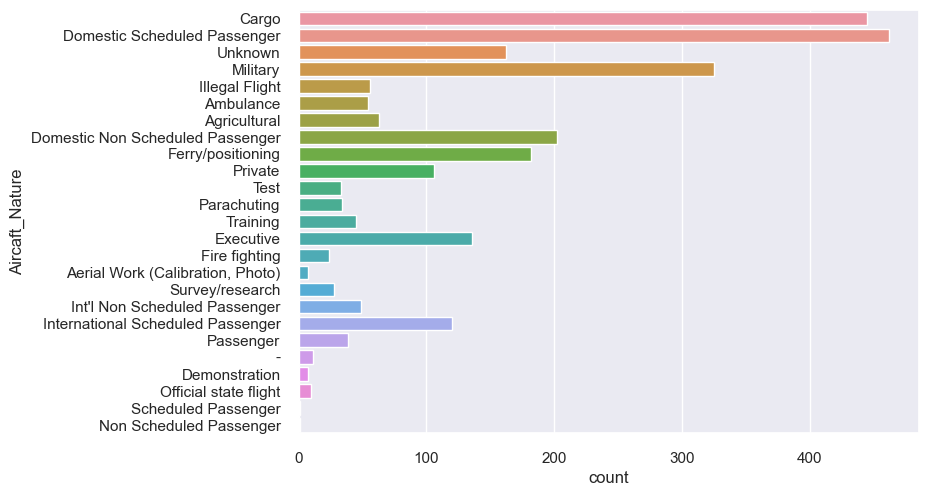

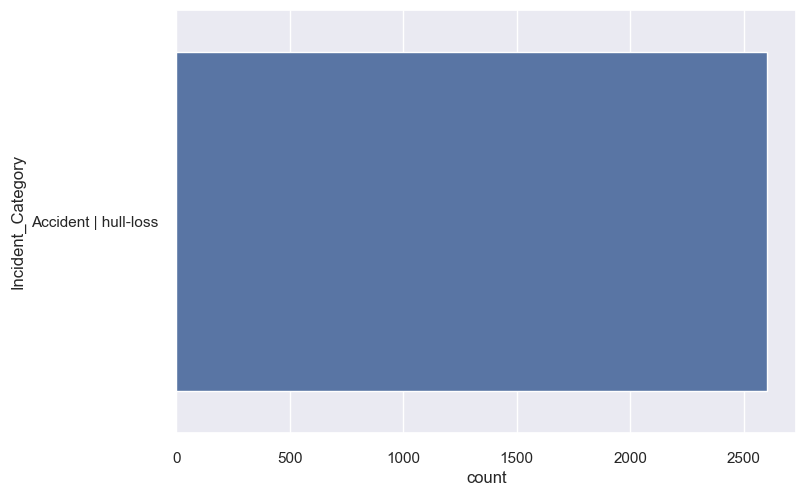

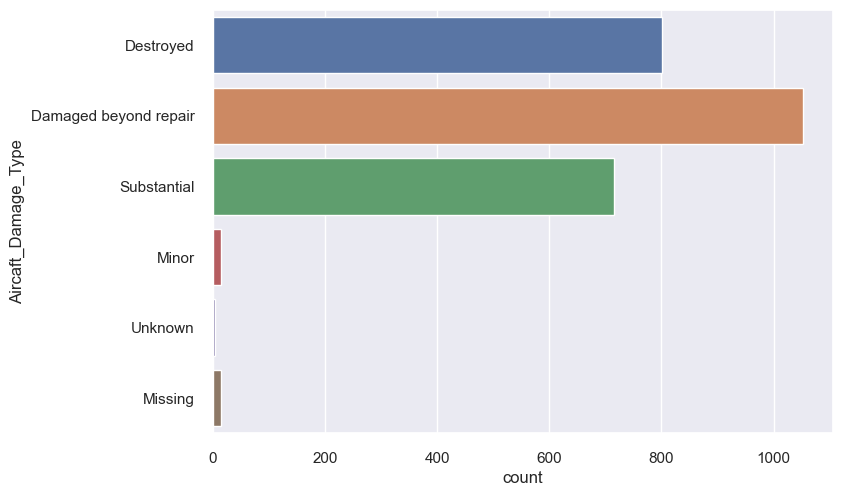

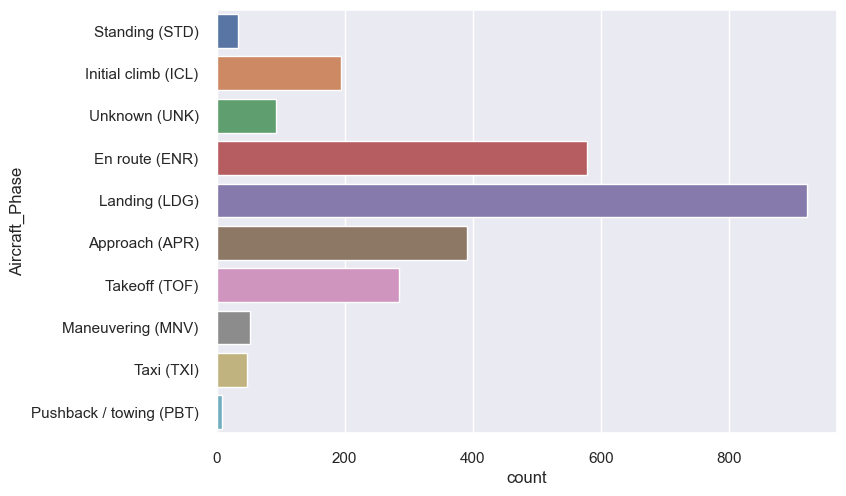

In [ ]:
for column in air_disaster_2000s_hull_loss_cleaned.select_dtypes(include='object'):
    if air_disaster_2000s_hull_loss_cleaned[column].nunique() < 50:
        sns.countplot(y=column, data=air_disaster_2000s_hull_loss_cleaned)
        plt.show()

In [ ]:
air_disaster_2000s.columns

Index(['Incident_Date', 'Aircaft_Model', 'Aircaft_Registration',
       'Aircaft_Operator', 'Aircaft_Nature', 'Incident_Category',
       'Incident_Cause(es)', 'Incident_Location', 'Aircaft_Damage_Type',
       'Date', 'Time', 'Arit', 'Aircaft_Engines', 'Onboard_Crew',
       'Onboard_Passengers', 'Onboard_Total', 'Fatalities',
       'Aircaft_First_Flight', 'Aircraft_Phase', 'Departure_Airport',
       'Destination_Airport', 'Ground_Casualties', 'Collision_Casualties',
       'Year', 'incident_count', 'Total Occupants', 'Total Passengers',
       'Total Crew', 'Total Onboard Fatalities', 'Total Passenger Fatalities',
       'Total Crew Fatalities'],
      dtype='object')

In [ ]:
from scipy.stats import chi2_contingency
# Here, we are focusing on one specific column 'General_Health' and 'Heart_Disease'
cross_tab = pd.crosstab(air_disaster_2000s['Aircaft_Damage_Type'], air_disaster_2000s['Aircaft_Operator'])
# Perform the chi-square test
chi2_stat, p_val, dof, expected = chi2_contingency(cross_tab)
# Output the results
print("Chi-Square Statistic:", chi2_stat)
print("P-value:", p_val)
print("Degrees of Freedom:", dof)
print("Expected Frequencies Table:")
print(pd.DataFrame(expected, index=cross_tab.index, columns=cross_tab.columns))
# Interpret the results
alpha = 0.05
print("\nSignificance Level (alpha):", alpha)
print("Is the p-value less than alpha?", p_val < alpha)
if p_val < alpha:
    print("Reject the Null Hypothesis (H0): There is a significant association between Aircraft Operator and Aircraft Damage Type.")
else:
    print("Fail to Reject the Null Hypothesis (H0): There is no significant association between General_Health and Heart_Disease.")

Chi-Square Statistic: 14154.077287646978
P-value: 3.492649107988194e-10
Degrees of Freedom: 13130
Expected Frequencies Table:
Aircaft_Operator       , op.for GoJump  , op.for Tlaxcala State Government  \
Aircaft_Damage_Type                                                          
Damaged beyond repair         0.285269                            0.285269   
Destroyed                     0.202047                            0.202047   
Minor                         0.039608                            0.039608   
Missing                       0.003338                            0.003338   
Substantial                   0.458389                            0.458389   
Unknown                       0.011348                            0.011348   

Aircaft_Operator       2M Leasing  2nd Arkhangelsk United Aviation Division  \
Aircaft_Damage_Type                                                           
Damaged beyond repair    0.285269                                  0.570538   
Destroyed   

In [ ]:
from scipy.stats import chi2_contingency
# Here, we are focusing on one specific column 'General_Health' and 'Heart_Disease'
cross_tab = pd.crosstab(air_disaster_2000s['Total Onboard Fatalities'], air_disaster_2000s['Aircaft_Operator'])
# Perform the chi-square test
chi2_stat, p_val, dof, expected = chi2_contingency(cross_tab)
# Output the results
print("Chi-Square Statistic:", chi2_stat)
print("P-value:", p_val)
print("Degrees of Freedom:", dof)
print("Expected Frequencies Table:")
print(pd.DataFrame(expected, index=cross_tab.index, columns=cross_tab.columns))
# Interpret the results
alpha = 0.05
print("\nSignificance Level (alpha):", alpha)
print("Is the p-value less than alpha?", p_val < alpha)
if p_val < alpha:
    print("Reject the Null Hypothesis (H0): There is a significant association between Aircraft Operator and Aircraft Damage Type.")
else:
    print("Fail to Reject the Null Hypothesis (H0): There is no significant association between General_Health and Heart_Disease.")

Chi-Square Statistic: 282672.4243955826
P-value: 1.0
Degrees of Freedom: 315945
Expected Frequencies Table:
Aircaft_Operator          , op.for GoJump  , op.for Tlaxcala State Government  \
Total Onboard Fatalities                                                        
0                                0.736051                            0.736051   
1                                0.043592                            0.043592   
2                                0.048169                            0.048169   
3                                0.030296                            0.030296   
4                                0.019398                            0.019398   
...                                   ...                                 ...   
239                              0.000218                            0.000218   
257                              0.000218                            0.000218   
260                              0.000218                            0.000218   
2

In [ ]:
from scipy.stats import chi2_contingency
# Here, we are focusing on one specific column 'General_Health' and 'Heart_Disease'
cross_tab = pd.crosstab(air_disaster_2000s['Total Onboard Fatalities'], air_disaster_2000s['Aircaft_Engines'])
# Perform the chi-square test
chi2_stat, p_val, dof, expected = chi2_contingency(cross_tab)
# Output the results
print("Chi-Square Statistic:", chi2_stat)
print("P-value:", p_val)
print("Degrees of Freedom:", dof)
print("Expected Frequencies Table:")
print(pd.DataFrame(expected, index=cross_tab.index, columns=cross_tab.columns))
# Interpret the results
alpha = 0.05
print("\nSignificance Level (alpha):", alpha)
print("Is the p-value less than alpha?", p_val < alpha)
if p_val < alpha:
    print("Reject the Null Hypothesis (H0): There is a significant association between Aircraft Operator and Aircraft Damage Type.")
else:
    print("Fail to Reject the Null Hypothesis (H0): There is no significant association between General_Health and Heart_Disease.")

Chi-Square Statistic: 93325.8615627098
P-value: 0.0
Degrees of Freedom: 69721
Expected Frequencies Table:
Aircaft_Engines           1 Garrett TPE331  1 Garrett TPE331-10  \
Total Onboard Fatalities                                          
0                                 2.920748             0.730187   
1                                 0.176907             0.044227   
2                                 0.205402             0.051351   
3                                 0.123479             0.030870   
4                                 0.079549             0.019887   
...                                    ...                  ...   
225                               0.001187             0.000297   
228                               0.001187             0.000297   
239                               0.001187             0.000297   
260                               0.001187             0.000297   
298                               0.001187             0.000297   

Aircaft_Engines       

In [ ]:
from scipy.stats import chi2_contingency
# Here, we are focusing on one specific column 'General_Health' and 'Heart_Disease'
cross_tab = pd.crosstab(air_disaster_2000s['Total Onboard Fatalities'], air_disaster_2000s['Incident_Cause(es)'])
# Perform the chi-square test
chi2_stat, p_val, dof, expected = chi2_contingency(cross_tab)
# Output the results
print("Chi-Square Statistic:", chi2_stat)
print("P-value:", p_val)
print("Degrees of Freedom:", dof)
print("Expected Frequencies Table:")
print(pd.DataFrame(expected, index=cross_tab.index, columns=cross_tab.columns))
# Interpret the results
alpha = 0.05
print("\nSignificance Level (alpha):", alpha)
print("Is the p-value less than alpha?", p_val < alpha)
if p_val < alpha:
    print("Reject the Null Hypothesis (H0): There is a significant association between Aircraft Operator and Aircraft Damage Type.")
else:
    print("Fail to Reject the Null Hypothesis (H0): There is no significant association between General_Health and Heart_Disease.")

Chi-Square Statistic: 128124.39664564742
P-value: 0.0
Degrees of Freedom: 69020
Expected Frequencies Table:
Incident_Cause(es)        ATC & navigation - Language/communication problems (also flightcr, Result - Runway mishap  \
Total Onboard Fatalities                                                                                              
0                                                                  0.736051                                           
1                                                                  0.043592                                           
2                                                                  0.048169                                           
3                                                                  0.030296                                           
4                                                                  0.019398                                           
...                                                        

In [ ]:
fatal_or_not = []

for fatal in air_disaster_2000s['Total Onboard Fatalities']:
    if fatal > 0:
        fatal_or_not.append(1)
    else:
        fatal_or_not.append(0)

In [ ]:
air_disaster_2000s['Fatal or Not'] = fatal_or_not

In [ ]:
from scipy.stats import chi2_contingency
# Here, we are focusing on one specific column 'General_Health' and 'Heart_Disease'
cross_tab = pd.crosstab(air_disaster_2000s['Fatal or Not'], air_disaster_2000s['Incident_Cause(es)'])
# Perform the chi-square test
chi2_stat, p_val, dof, expected = chi2_contingency(cross_tab)
# Output the results
print("Chi-Square Statistic:", chi2_stat)
print("P-value:", p_val)
print("Degrees of Freedom:", dof)
print("Expected Frequencies Table:")
print(pd.DataFrame(expected, index=cross_tab.index, columns=cross_tab.columns))
# Interpret the results
alpha = 0.05
print("\nSignificance Level (alpha):", alpha)
print("Is the p-value less than alpha?", p_val < alpha)
if p_val < alpha:
    print("Reject the Null Hypothesis (H0): There is a significant association between Aircraft Operator and Aircraft Damage Type.")
else:
    print("Fail to Reject the Null Hypothesis (H0): There is no significant association between General_Health and Heart_Disease.")

Chi-Square Statistic: 2580.100591898037
P-value: 3.1302952563137346e-249
Degrees of Freedom: 580
Expected Frequencies Table:
Incident_Cause(es)  ATC & navigation - Language/communication problems (also flightcr, Result - Runway mishap  \
Fatal or Not                                                                                                    
no                                                           0.736051                                           
yes                                                          0.263949                                           

Incident_Cause(es)  ATC & navigation - VFR flight in IMC  \
Fatal or Not                                               
no                                              0.736051   
yes                                             0.263949   

Incident_Cause(es)  ATC & navigation - VFR flight in IMC, Flightcrew - Insufficient rest / fatigue, Result - CFIT - Hill, mountain  \
Fatal or Not                                   

In [ ]:
from scipy.stats import chi2_contingency
# Here, we are focusing on one specific column 'General_Health' and 'Heart_Disease'
cross_tab = pd.crosstab(air_disaster_2000s['Fatal or Not'], air_disaster_2000s['Aircaft_Operator'])
# Perform the chi-square test
chi2_stat, p_val, dof, expected = chi2_contingency(cross_tab)
# Output the results
print("Chi-Square Statistic:", chi2_stat)
print("P-value:", p_val)
print("Degrees of Freedom:", dof)
print("Expected Frequencies Table:")
print(pd.DataFrame(expected, index=cross_tab.index, columns=cross_tab.columns))
# Interpret the results
alpha = 0.05
print("\nSignificance Level (alpha):", alpha)
print("Is the p-value less than alpha?", p_val < alpha)
if p_val < alpha:
    print("Reject the Null Hypothesis (H0): There is a significant association between Aircraft Operator and whether the incident was fatal.")
else:
    print("Fail to Reject the Null Hypothesis (H0): There is no significant association between Aircraft Operator and whether the incident was fatal.")

Chi-Square Statistic: 2946.3281896468625
P-value: 5.453597101648969e-05
Degrees of Freedom: 2655
Expected Frequencies Table:
Aircaft_Operator  , op.for GoJump  , op.for Tlaxcala State Government  \
Fatal or Not                                                            
0                        0.736051                            0.736051   
1                        0.263949                            0.263949   

Aircaft_Operator  2M Leasing  2nd Arkhangelsk United Aviation Division  \
Fatal or Not                                                             
0                   0.736051                                  1.472101   
1                   0.263949                                  0.527899   

Aircaft_Operator  2nd Sverdlovsk Aviation Enterprise  748 Air Services  \
Fatal or Not                                                             
0                                           2.208152          2.944202   
1                                           0.791848          1

In [ ]:
from scipy.stats import chi2_contingency
# Here, we are focusing on one specific column 'General_Health' and 'Heart_Disease'
cross_tab = pd.crosstab(air_disaster_2000s['Fatal or Not'], air_disaster_2000s['Incident_Cause(es)'])
# Perform the chi-square test
chi2_stat, p_val, dof, expected = chi2_contingency(cross_tab)
# Output the results
print("Chi-Square Statistic:", chi2_stat)
print("P-value:", p_val)
print("Degrees of Freedom:", dof)
print("Expected Frequencies Table:")
print(pd.DataFrame(expected, index=cross_tab.index, columns=cross_tab.columns))
# Interpret the results
alpha = 0.05
print("\nSignificance Level (alpha):", alpha)
print("Is the p-value less than alpha?", p_val < alpha)
if p_val < alpha:
    print("Reject the Null Hypothesis (H0): There is a significant association between Incident_Cause(es) and whether the incident was fatal.")
else:
    print("Fail to Reject the Null Hypothesis (H0): There is no significant association between Incident_Cause(es) and whether the incident was fatal.")

Chi-Square Statistic: 2580.100591898037
P-value: 3.1302952563137346e-249
Degrees of Freedom: 580
Expected Frequencies Table:
Incident_Cause(es)  ATC & navigation - Language/communication problems (also flightcr, Result - Runway mishap  \
Fatal or Not                                                                                                    
0                                                            0.736051                                           
1                                                            0.263949                                           

Incident_Cause(es)  ATC & navigation - VFR flight in IMC  \
Fatal or Not                                               
0                                               0.736051   
1                                               0.263949   

Incident_Cause(es)  ATC & navigation - VFR flight in IMC, Flightcrew - Insufficient rest / fatigue, Result - CFIT - Hill, mountain  \
Fatal or Not                                   

In [ ]:
air_disaster_2000s_fatal_or_not = air_disaster_2000s.drop(columns=['Aircaft_Registration'
                                           ,'Year', 'Total Passenger Fatalities', 'Total Crew Fatalities'
                                           , 'Total Crew', 'Total Passengers', 'Incident_Date'
                                           , 'Incident_Location', 'Ground_Casualties'
                                           ,'Date', 'Time', 'Arit'
                                           ,'Onboard_Crew', 'Onboard_Total', 'Fatalities'
                                           ,'Onboard_Passengers', 'Aircaft_First_Flight', 'Collision_Casualties'
                                           ,'Departure_Airport', 'Destination_Airport', 'incident_count'
                                           ,'Total Occupants', 'Total Onboard Fatalities'])

In [ ]:
air_disaster_2000s_fatal_or_not

,Aircaft_Model,Aircaft_Operator,Aircaft_Nature,Incident_Category,Incident_Cause(es),Aircaft_Damage_Type,Aircaft_Engines,Aircraft_Phase,Fatal or Not
0,British Aerospace 4121 Jetstream 41,SA Airlink,Domestic Non Scheduled Passenger,Accident | repairable-damage,"Airplane - Engines, Airplane - Engines - Prop/...",Substantial,2 Garrett TPE331-14GR-805H,Landing (LDG),0
1,British Aerospace 3101 Jetstream 31,LANHSA,Domestic Scheduled Passenger,Accident | repairable-damage,"Airplane - Undercarriage, Airplane - Undercarr...",Substantial,NaN,Landing (LDG),0
2,Boeing 737-4H6,Caspian Airlines,Domestic Scheduled Passenger,Accident | repairable-damage,"Airplane - Undercarriage, Airplane - Undercarr...",Substantial,2 CFMI CFM56-3C1,Landing (LDG),0
3,Tupolev Tu-204-100C,"Cainiao, opb Aviastar-TU",Cargo,Accident | hull-loss,"Cargo - Fire/smoke, Result - Damaged on the gr...",Destroyed,2 Soloviev PS-90A,Standing (STD),0
4,Beechcraft 200 Super King Air,private,Illegal Flight,"Criminal occurrence (sabotage, shoot down) | h...",Result - Damaged on the ground,Damaged beyond repair,NaN,Standing (STD),0
...,...,...,...,...,...,...,...,...,...
4583,McDonnell Douglas DC-10-10,"American Airlines, op.for Hawaiian Airlines",International Scheduled Passenger,Accident | repairable-damage,Result - Runway excursion,Substantial,3 General Electric CF6-6K,Landing (LDG),0
4584,Beechcraft 200 Super King Air,Videovision Broadcast,Domestic Non Scheduled Passenger,Accident | hull-loss,Result - Loss of control,Damaged beyond repair,2 Pratt Whitney Canada PT6A-42,Takeoff (TOF),1
4585,British Aerospace 4101 Jetstream 41,"United Express, opb Atlantic Coast Airlines",Domestic Scheduled Passenger,Accident | hull-loss,Result - Runway excursion,Substantial,2 Garrett TPE331-14HR-801H,Landing (LDG),0
4586,Boeing 747-436,British Airways,International Scheduled Passenger,Hijacking | repairable-damage,Result - Hijacking - Hijacker(s) overpowered b...,NaN,4 Rolls-Royce RB211-524G,En route (ENR),0


In [ ]:
X = pd.get_dummies(air_disaster_2000s_fatal_or_not, columns=['Aircaft_Model', 'Aircaft_Operator', 'Aircaft_Nature','Incident_Category','Incident_Cause(es)','Aircaft_Damage_Type', 'Aircaft_Engines', 'Aircraft_Phase'], dtype=int)

In [ ]:
X = X.drop(columns='Fatal or Not')

In [ ]:
y = air_disaster_2000s_fatal_or_not['Fatal or Not']
X_train, X_test, y_train, y_test = fun.train_test_split(X, y, test_size=.3, random_state=40)

In [ ]:
X_train

,"Aircraft, Collision","Airframe, Airplane","Airframe, Flightcrew","Airframe, Result","Alcohol, drug usage","Alcohol, drug usage, Flightcrew","Alcohol, drug usage, Landing/takeoff","Alcohol, drug usage, Result",CFIT,Cause undetermined,...,VFR flight in IMC,"VFR flight in IMC, Flightcrew","VFR flight in IMC, Landing/takeoff","VFR flight in IMC, Result",Wake vortex,"Wake vortex, Result","Wind, hail, Result",Windshear/downdraft,"Wrong installation of parts, Result",Unavailable
722,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4295,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2823,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1275,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3872,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2103,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3603,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3340,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3064,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
model = fun.LogisticRegressionCV(cv=10, random_state=40, max_iter=10000)
    # Fit model
model.fit(X_train, y_train)

LogisticRegressionCV(cv=10, max_iter=10000, random_state=40)

In [ ]:
model.predict(X_test)

array([1, 0, 0, ..., 1, 0, 0])

/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but LogisticRegressionCV was fitted with feature names
  warnings.warn(


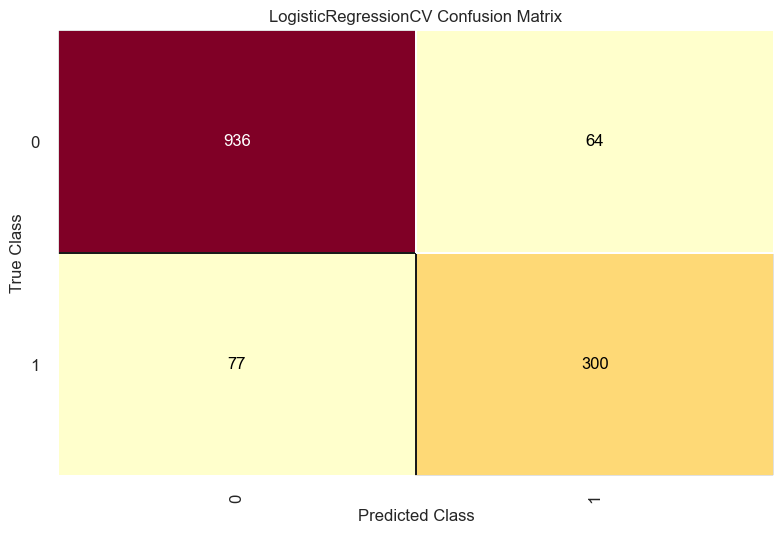

<Axes: title={'center': 'LogisticRegressionCV Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [ ]:
cm = ConfusionMatrix(model)
cm.fit(X_train, y_train)
cm.score(X_test, y_test)

# How did we do?
cm.show()

/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but LogisticRegressionCV was fitted with feature names
  warnings.warn(


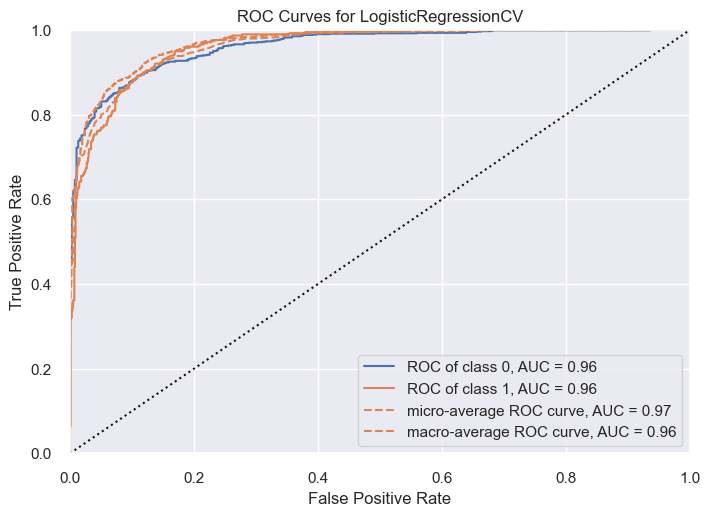

<Axes: title={'center': 'ROC Curves for LogisticRegressionCV'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

from yellowbrick.classifier import ROCAUC
visualizer = ROCAUC(model)

visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show()   

In [ ]:
X.shape

(4588, 5214)

In [ ]:
X1 = pd.get_dummies(air_disaster_2000s_fatal_or_not, columns=['Aircaft_Model'], dtype=int)

In [ ]:
X1 = X1.drop(columns=['Aircaft_Operator', 'Aircaft_Nature','Incident_Category','Incident_Cause(es)','Aircaft_Damage_Type', 'Aircaft_Engines', 'Aircraft_Phase', 'Fatal or Not'])

In [ ]:
X_train, X_test, y_train, y_test = fun.train_test_split(X1, y, test_size=.3, random_state=40)

In [ ]:
model = fun.LogisticRegressionCV(cv=10, random_state=40, max_iter=10000)
    # Fit model
model.fit(X_train, y_train)

LogisticRegressionCV(cv=10, max_iter=10000, random_state=40)

In [ ]:
model.predict(X_test)

array([0, 0, 0, ..., 0, 0, 0])

/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but LogisticRegressionCV was fitted with feature names
  warnings.warn(


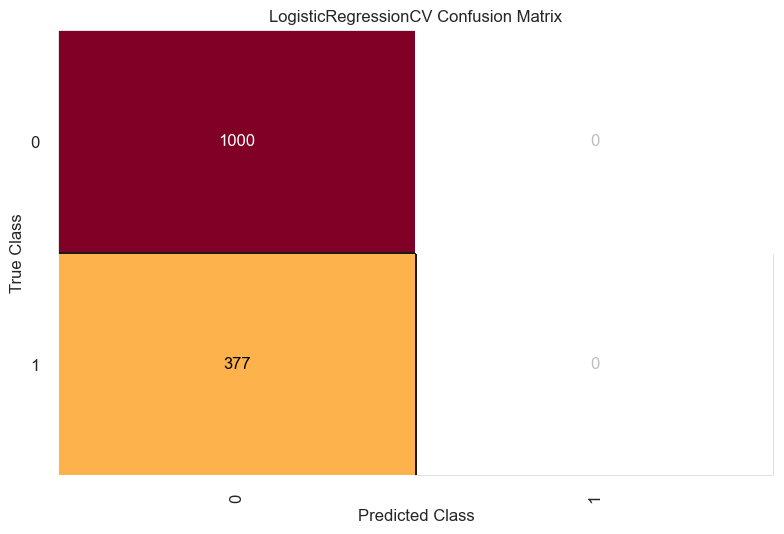

<Axes: title={'center': 'LogisticRegressionCV Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [ ]:
cm = ConfusionMatrix(model)
cm.fit(X_train, y_train)
cm.score(X_test, y_test)

# How did we do?
cm.show()

/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but LogisticRegressionCV was fitted with feature names
  warnings.warn(


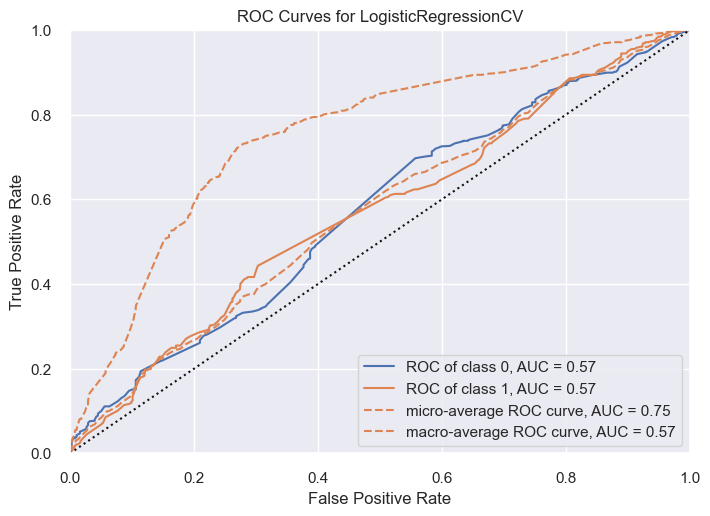

<Axes: title={'center': 'ROC Curves for LogisticRegressionCV'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

from yellowbrick.classifier import ROCAUC
visualizer = ROCAUC(model)

visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show() 

In [ ]:
X2 = pd.get_dummies(air_disaster_2000s_fatal_or_not, columns=['Aircaft_Operator'],prefix='',prefix_sep='', dtype=int)
X2 = X2.drop(columns=['Aircaft_Model', 'Aircaft_Nature','Incident_Category','Incident_Cause(es)','Aircaft_Damage_Type', 'Aircaft_Engines', 'Aircraft_Phase', 'Fatal or Not'])
X_train, X_test, y_train, y_test = fun.train_test_split(X2, y, test_size=.3, random_state=40)

In [ ]:
model = fun.LogisticRegressionCV(cv=10, random_state=40, max_iter=10000)
    # Fit model
model.fit(X_train, y_train)

LogisticRegressionCV(cv=10, max_iter=10000, random_state=40)

/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but LogisticRegressionCV was fitted with feature names
  warnings.warn(


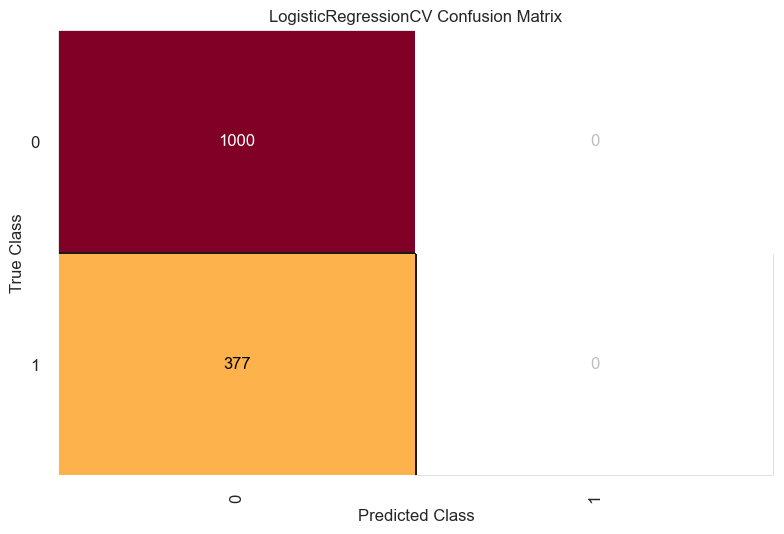

<Axes: title={'center': 'LogisticRegressionCV Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [ ]:
cm = ConfusionMatrix(model)
cm.fit(X_train, y_train)
cm.score(X_test, y_test)

# How did we do?
cm.show()

/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but LogisticRegressionCV was fitted with feature names
  warnings.warn(


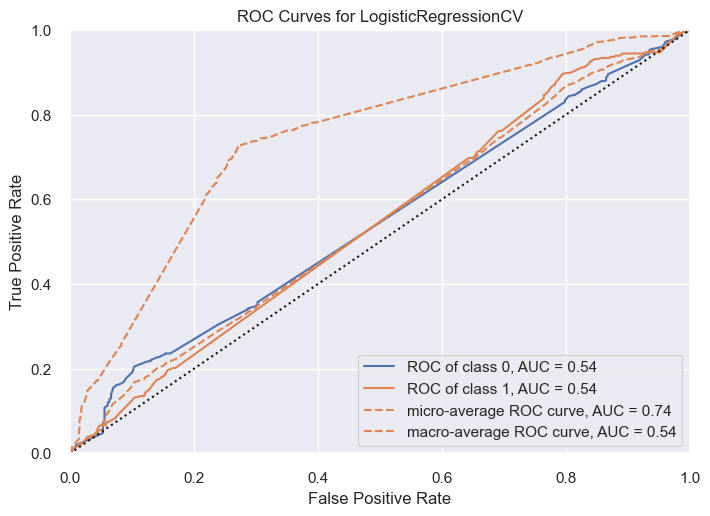

<Axes: title={'center': 'ROC Curves for LogisticRegressionCV'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [ ]:
visualizer = ROCAUC(model)

visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show() 

In [ ]:
X3 = pd.get_dummies(air_disaster_2000s_fatal_or_not, columns=['Incident_Cause(es)'],prefix='',prefix_sep='', dtype=int)
X3 = X3.drop(columns=['Aircaft_Model', 'Aircaft_Nature','Incident_Category','Aircaft_Operator','Aircaft_Damage_Type', 'Aircaft_Engines', 'Aircraft_Phase', 'Fatal or Not'])
X_train, X_test, y_train, y_test = fun.train_test_split(X3, y, test_size=.3, random_state=40)

In [ ]:
model = fun.LogisticRegressionCV(cv=10, random_state=40, max_iter=10000)
    # Fit model
model.fit(X_train, y_train)

LogisticRegressionCV(cv=10, max_iter=10000, random_state=40)

/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but LogisticRegressionCV was fitted with feature names
  warnings.warn(


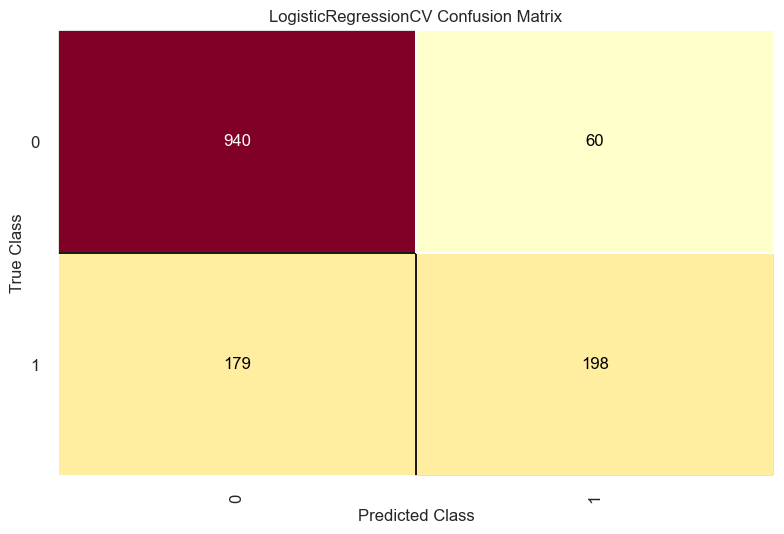

<Axes: title={'center': 'LogisticRegressionCV Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [ ]:
cm = ConfusionMatrix(model)
cm.fit(X_train, y_train)
cm.score(X_test, y_test)

# How did we do?
cm.show()

/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but LogisticRegressionCV was fitted with feature names
  warnings.warn(


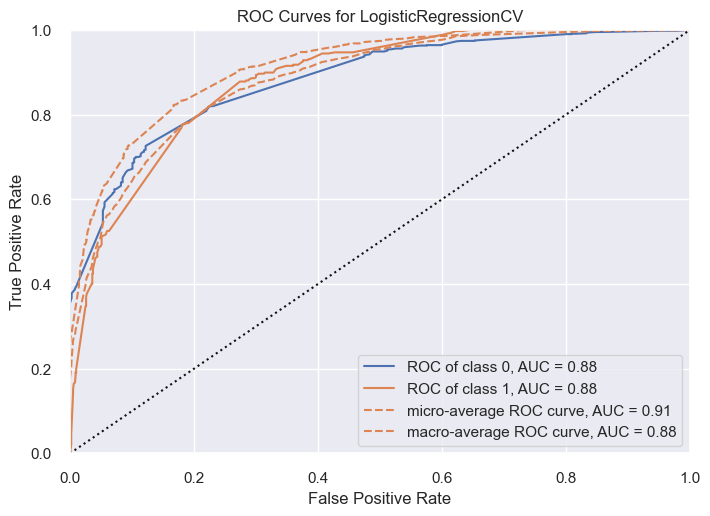

<Axes: title={'center': 'ROC Curves for LogisticRegressionCV'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [ ]:
visualizer = ROCAUC(model)

visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show() 

In [ ]:
air_disaster_2000s['Incident_Cause(es)']

0       Airplane - Engines, Airplane - Engines - Prop/...
1       Airplane - Undercarriage, Airplane - Undercarr...
2       Airplane - Undercarriage, Airplane - Undercarr...
3       Cargo - Fire/smoke, Result - Damaged on the gr...
4                          Result - Damaged on the ground
                              ...                        
4583                            Result - Runway excursion
4584                             Result - Loss of control
4585                            Result - Runway excursion
4586    Result - Hijacking - Hijacker(s) overpowered b...
4587                       Result - Damaged on the ground
Name: Incident_Cause(es), Length: 4588, dtype: object

In [ ]:
model.coef_

model.feature_names_in_

array(['ATC & navigation - Language/communication problems (also flightcr, Result - Runway mishap',
       'ATC & navigation - VFR flight in IMC',
       'ATC & navigation - VFR flight in IMC, Flightcrew - Insufficient rest / fatigue, Result - CFIT - Hill, mountain',
       'ATC & navigation - VFR flight in IMC, Landing/takeoff - Landing, Landing/takeoff - Landing - Unstabilized approach, Result - Runway excursion',
       'ATC & navigation - VFR flight in IMC, Result - CFIT - Hill, mountain',
       'ATC & navigation - VFR flight in IMC, Result - CFIT - Level ground',
       'ATC & navigation - VFR flight in IMC, Result - CFIT - Level ground, Weather - Visibility -low',
       'ATC & navigation - VFR flight in IMC, Result - Loss of control',
       'ATC & navigation - VFR flight in IMC, Result - Runway mishap',
       'Airplane - Airframe, Airplane - Airframe - Cargo door, Flightcrew - Distraction in cockpit, Result - Loss of control',
       'Airplane - Airframe, Airplane - Airframe 

In [ ]:
model_output = pd.DataFrame()

In [ ]:
model_output['Coeficient'] = (model.coef_).flatten()
model_output['Feature Name'] = model.feature_names_in_

In [ ]:
model_output = model_output.set_index('Feature Name')

Feature: 0, Score: Coeficient


TypeError: only length-1 arrays can be converted to Python scalars

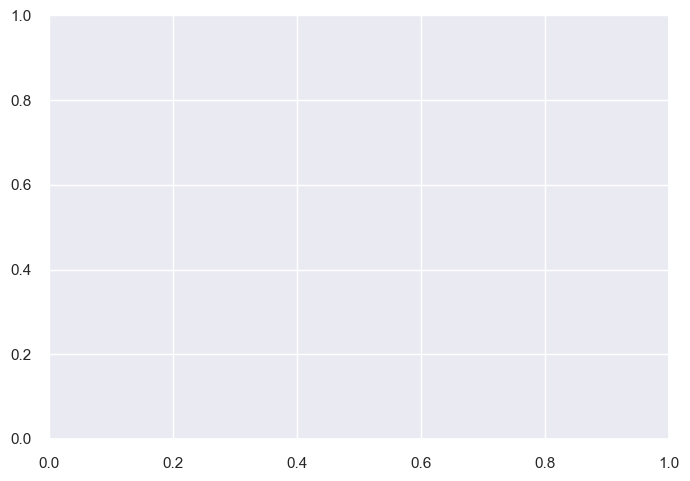

In [ ]:
#importance = model.coef_[0]
# summarize feature importance
for i,v in enumerate(model_output):
 print(f'Feature: {i}, Score: {v}')
# plot feature importance
plt.bar([x for x in range(len(model_output))], model_output)
plt.show()

In [ ]:
air_disaster_2000s = air_disaster_2000s.fillna('NA')

In [ ]:
causes = ['']
for cause in air_disaster_2000s['Incident_Cause(es)']:
    new = cause.split('-')
    causes.append(new[1])

In [ ]:
causes.remove(causes[0])

In [ ]:
causes

[' Engines, Airplane ',
 ' Undercarriage, Airplane ',
 ' Undercarriage, Airplane ',
 ' Fire/smoke, Result ',
 ' Damaged on the ground',
 ' Tailstrike, Result ',
 ' Runway excursion',
 'Unavailable',
 'Unavailable',
 'Unavailable',
 'Unavailable',
 ' Runway mishap',
 ' Runway excursion',
 'Unavailable',
 ' Loss of control',
 ' Loss of control, Result ',
 'Unavailable',
 ' Landing, Landing/takeoff ',
 ' Damaged on the ground',
 ' Emergency, forced landing ',
 ' Runway excursion',
 'Unavailable',
 ' Runway excursion',
 ' Runway excursion',
 'Unavailable',
 ' Loss of control',
 ' Tailstrike, Result ',
 ' Loss of control',
 ' Undercarriage, Airplane ',
 ' Damaged on the ground',
 ' Damaged on the ground',
 ' Takeoff ',
 ' Runway mishap',
 ' Landing, Landing/takeoff ',
 ' Runway mishap',
 'Unavailable',
 'Unavailable',
 'Unavailable',
 ' Engines, Airplane ',
 ' Undershoot / overshoot',
 ' Loss of control, Weather ',
 ' Undercarriage, Airplane ',
 ' Engines, Airplane ',
 ' Hijacking ',
 ' Und

In [ ]:
len(causes)

4588

In [ ]:
len(air_disaster_2000s)

4588

In [ ]:
air_disaster_2000s['Incident Cause'] = causes

In [ ]:
air_disaster_2000s_fatal_or_not['Incident Cause'] = causes

In [ ]:
X4 = pd.get_dummies(air_disaster_2000s_fatal_or_not, columns=['Incident Cause'],prefix='',prefix_sep='', dtype=int)
X4 = X4.drop(columns=['Aircaft_Model', 'Aircaft_Nature','Incident_Category','Aircaft_Operator','Aircaft_Damage_Type', 'Aircaft_Engines', 'Aircraft_Phase', 'Fatal or Not', 'Incident_Cause(es)'])
X_train, X_test, y_train, y_test = fun.train_test_split(X4, y, test_size=.3, random_state=40)

In [ ]:
model = fun.LogisticRegressionCV(cv=10, random_state=40, max_iter=10000)
    # Fit model
model.fit(X_train, y_train)

LogisticRegressionCV(cv=10, max_iter=10000, random_state=40)

In [ ]:
model = fun.LogisticRegression()
    # Fit model
model.fit(X_train, y_train)

LogisticRegression()

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [ ]:
labels= ['Non-fatal', 'Fatal']

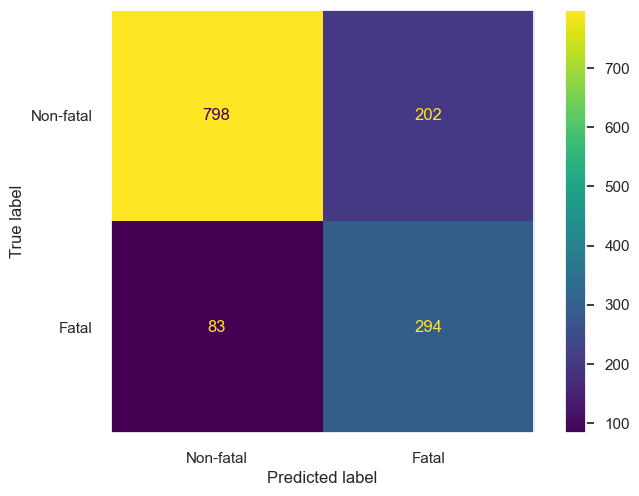

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
#change label value to match your target categories.  0 is first
labels= ['Non-fatal', 'Fatal']

#change threshold to tweak how the model predicts. 
threshold = 0.32

y_pred = (model.predict_proba(X_test)[:, 1] > threshold).astype('float')
cm = confusion_matrix(y_test, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot()
plt.grid(None) 
plt.show()

/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


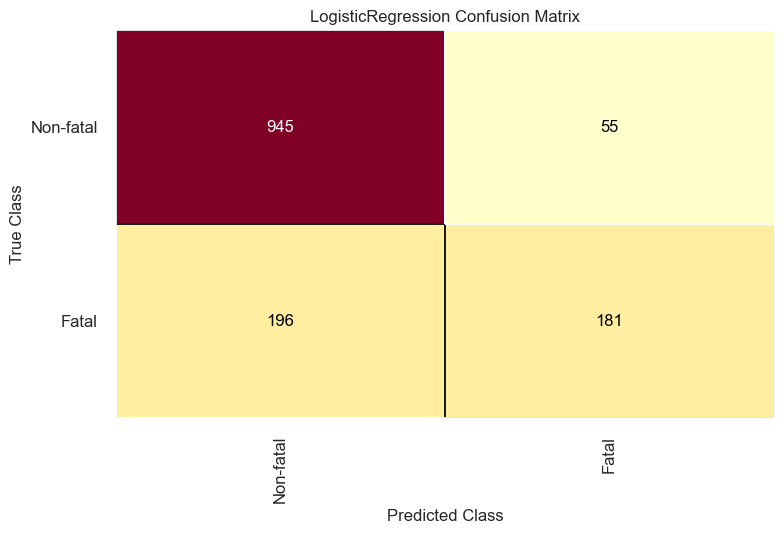

<Axes: title={'center': 'LogisticRegression Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [ ]:
cm = ConfusionMatrix(model, classes=labels)
cm.fit(X_train, y_train)
cm.score(X_test, y_test)

# How did we do?
cm.show()

/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but LogisticRegressionCV was fitted with feature names
  warnings.warn(


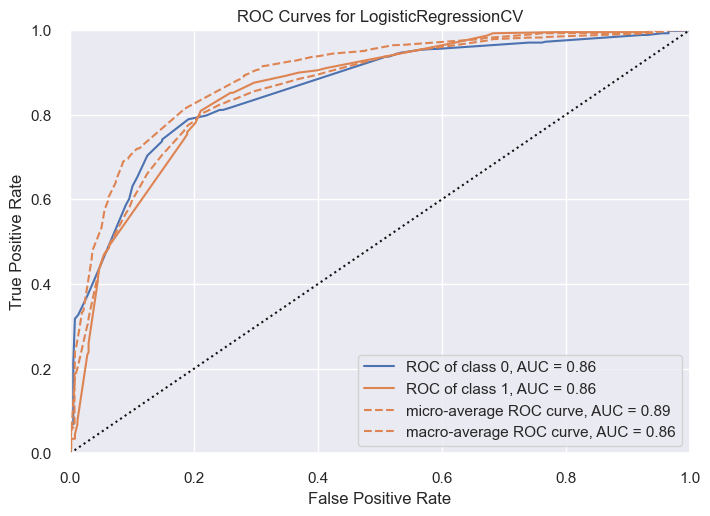

<Axes: title={'center': 'ROC Curves for LogisticRegressionCV'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [ ]:
visualizer = ROCAUC(model)

visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show() 

In [ ]:
model.feature_names_in_

array([' Aircraft, Collision ', ' Airframe, Airplane ',
       ' Airframe, Flightcrew ', ' Airframe, Result ',
       ' Alcohol, drug usage', ' Alcohol, drug usage, Flightcrew ',
       ' Alcohol, drug usage, Landing/takeoff ',
       ' Alcohol, drug usage, Result ', ' CFIT ', ' Cause undetermined',
       ' CofG', ' CofG, Cargo ', ' CofG, Collision ',
       ' CofG, Flightcrew ', ' CofG, Landing/takeoff ', ' CofG, Result ',
       ' Damaged on the ground', ' Damaged on the ground, Security ',
       ' Damaged on the ground, Weather ', ' Destroyed on ground',
       ' Disorientation, situational awareness',
       ' Disorientation, situational awareness, Flightcrew ',
       ' Disorientation, situational awareness, Landing/takeoff ',
       ' Disorientation, situational awareness, Result ',
       ' Disorientation, situational awareness, Weather ',
       ' Distraction in cockpit, Landing/takeoff ',
       ' Distraction in cockpit, Result ', ' Emergency, forced landing ',
       ' Engi

In [ ]:
model.coef_

array([[ -0.99987975,   1.55657541,   7.95004152,   2.31929485,
          0.        ,   8.87691908,   7.94137517,   9.83517556,
          2.560751  ,   7.94261576,  -6.46246183,   8.49383414,
          0.        ,   7.93585484,  -7.10479928,   1.62574667,
         -4.70631611,  -9.44092318,  -6.46897908,   0.        ,
          8.49392155,   8.87632681,   7.95056944,   3.34869847,
          7.95264735,  -6.4682029 ,   0.30396949,  -0.97099187,
          7.94371192,   0.70940243,  -0.59193199,   0.01675268,
          0.        ,   0.70842646,   1.4025461 ,  -0.34642547,
          0.        ,  -6.4682029 ,   7.95514043,   0.        ,
         -7.49069175,   0.        ,  -7.1103899 ,  -0.67657353,
          0.70940228,   0.        ,   0.23969443,   7.95264735,
         -0.38802203,  -9.35349475,  -7.10517085,   8.88416766,
         -6.4682029 ,  -1.33350076,   0.        ,   0.        ,
          1.80769228,   7.94944479,   0.        ,   1.11514767,
          2.09589354,   7.95514043,  -6.

In [ ]:
model_output1 = pd.DataFrame()
model_output1['Coeficient'] = (model.coef_).flatten()
model_output1['Feature Name'] = model.feature_names_in_

In [ ]:
model_output1 = model_output1.sort_values(by='Coeficient', ascending=False)

In [ ]:
model_output1

,Coeficient,Feature Name
7,9.835176,"Alcohol, drug usage, Result"
79,9.703067,Missing
107,9.378769,Suicide
74,9.162601,"Loss of control, Security"
51,8.884168,"Hijack, Security"
...,...,...
88,-8.636128,"Object, Result"
49,-9.353495,"Hangar, ground fire, Result"
17,-9.440923,"Damaged on the ground, Security"
130,-10.067839,"Wind, hail, Result"


In [ ]:
new_features = []
for line in model_output1['Feature Name']:
    if ', Result' in line:
        new_line = line.replace(', Result ', '')

        new_features.append('Result of' + new_line)
    else:
        new_features.append(line)

In [ ]:
model_output1['Feature Name'] = new_features

<Axes: xlabel='Coeficient', ylabel='Feature Name'>

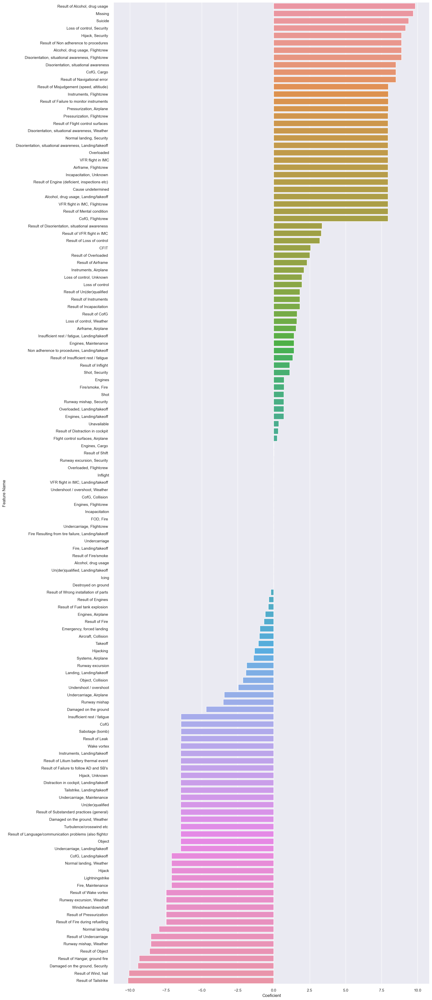

In [ ]:
fig, ax = plt.subplots(figsize= (16, 50))
sns.barplot(model_output1, y='Feature Name', x='Coeficient')

In [ ]:
model_upper_coef = model_output1[model_output1['Coeficient'] > 8.5]
model_lower_coef = model_output1[model_output1['Coeficient'] < -8]



In [ ]:
model_lower_coef

In [ ]:
fun.find_replace(model_lower_coef, )

Text(0.5, 1.0, 'Incident Causes Least Likely to be Associated with Fatalities\n2000-2022')

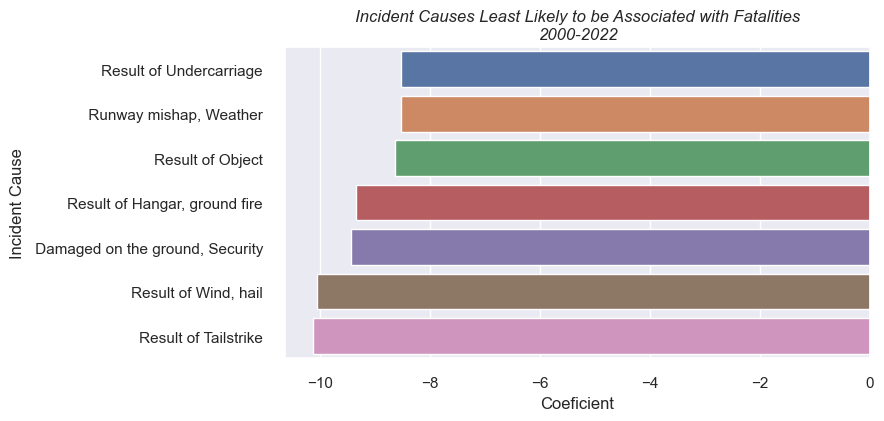

In [ ]:
fig , ax = plt.subplots(figsize=(9, 4))
sns.barplot(model_lower_coef, y='Feature Name', x='Coeficient')
plt.tight_layout()
ax.set_ylabel('Incident Cause')
ax.set_title('Incident Causes Least Likely to be Associated with Fatalities\n2000-2022', style= 'italic')

Text(0.5, 1.0, 'Incident Causes Most Likely to be Associated with Fatalities\n2000-2022')

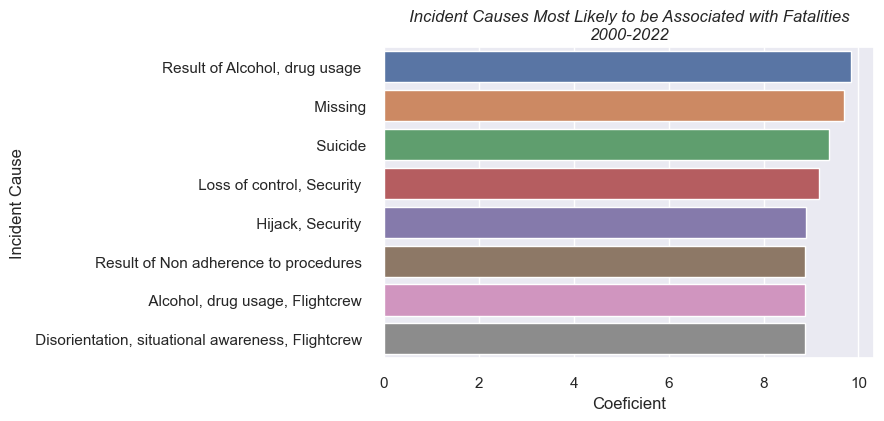

In [ ]:
fig , ax = plt.subplots(figsize=(9, 4))
sns.barplot(model_upper_coef, y='Feature Name', x='Coeficient')
plt.tight_layout()
ax.set_ylabel('Incident Cause')
ax.set_title('Incident Causes Most Likely to be Associated with Fatalities\n2000-2022', style= 'italic')

In [ ]:
fatal_incidents_by_cause = air_disaster_2000s.groupby('Incident Cause')['Fatal or Not'].value_counts().sort_values(ascending=False)

In [ ]:
total_fatalities_by_cause = air_disaster_2000s.groupby('Incident Cause')['Total Onboard Fatalities'].sum().sort_values(ascending=False)

In [ ]:
total_fatalities_by_cause = pd.DataFrame(total_fatalities_by_cause)
fatal_incidents_by_cause = pd.DataFrame(fatal_incidents_by_cause).reset_index()

In [ ]:
total_fatalities_by_cause = total_fatalities_by_cause[total_fatalities_by_cause['Total Onboard Fatalities']>10]
fatal_incidents_by_cause = fatal_incidents_by_cause[fatal_incidents_by_cause['Fatal or Not']==1]
fatal_incidents_by_cause = fatal_incidents_by_cause[fatal_incidents_by_cause['count']>9]
fatal_incidents_by_cause = fatal_incidents_by_cause[fatal_incidents_by_cause['Incident Cause']!= 'Unavailable']

In [ ]:
total_fatalities_by_cause
fatal_incidents_by_cause

,Incident Cause,Fatal or Not,count
7,CFIT,1,180
10,Loss of control,1,150
17,"Engines, Airplane",1,56
18,"Loss of control, Weather",1,44
19,Runway excursion,1,43
22,"VFR flight in IMC, Result",1,36
28,"Emergency, forced landing",1,28
29,"Aircraft, Collision",1,25
31,"Landing, Landing/takeoff",1,19
32,"Engines, Result",1,18


ValueError: Could not interpret input 'Incident Cause'

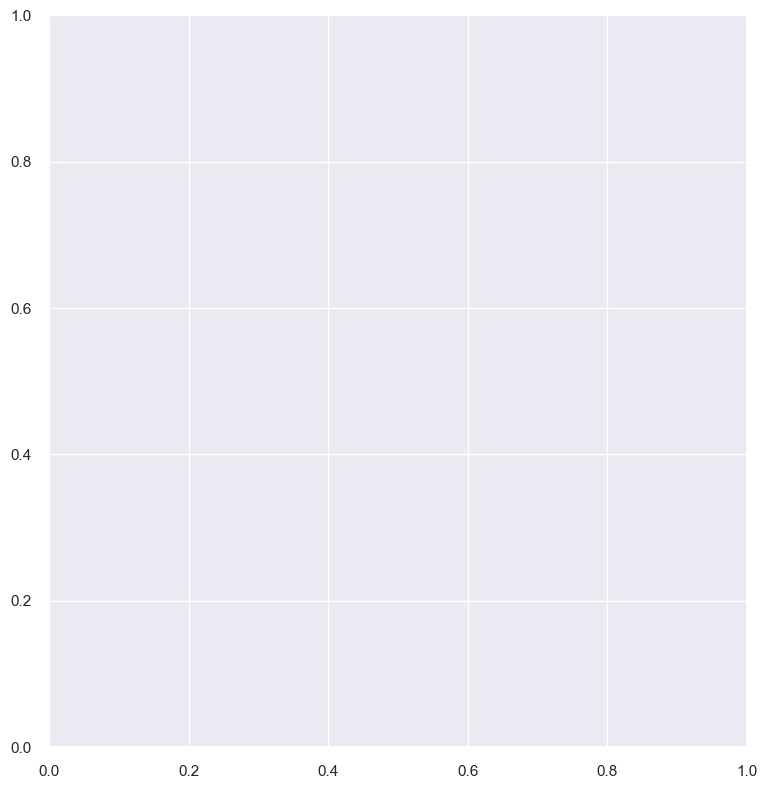

In [ ]:
fig , ax = plt.subplots(figsize=(9, 9.5))
sns.barplot(total_fatalities_by_cause, y='Incident Cause', x='Total Onboard Fatalities')
plt.tight_layout()

In [ ]:
new_features = []
for line in fatal_incidents_by_cause['Incident Cause']:
    if ', Result' in line:
        new_line = line.replace(', Result ', '')

        new_features.append('Result of' + new_line)
    else:
        new_features.append(line)

In [ ]:
fatal_incidents_by_cause['Incident Cause'] = new_features

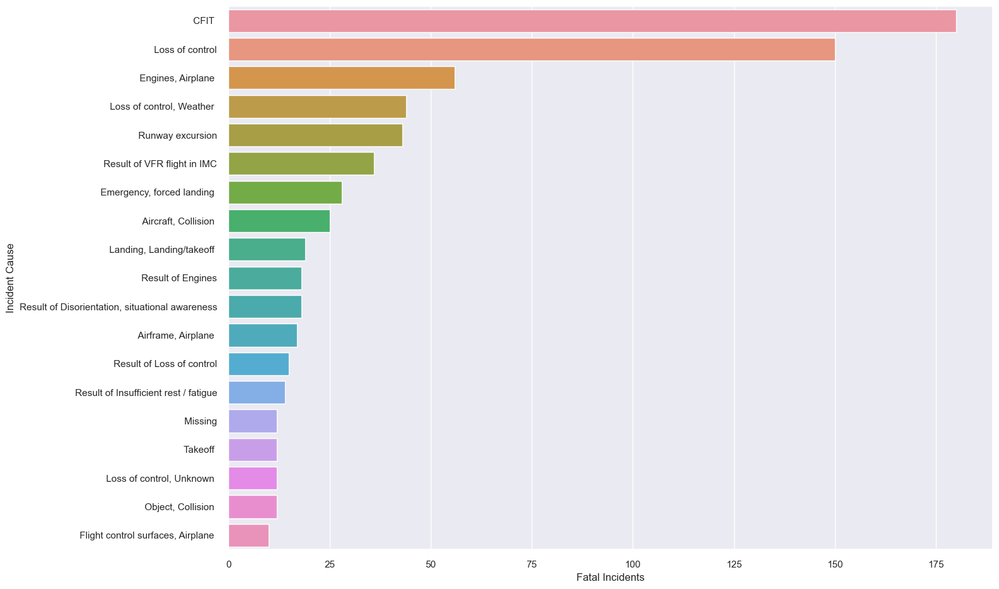

In [ ]:
fig , ax = plt.subplots(figsize=(16, 9.5))
sns.barplot(fatal_incidents_by_cause, y='Incident Cause', x='count')
plt.tight_layout()
#plt.xticks(rotation = 290)
ax.set_xlabel('Fatal Incidents')
sns.set_theme()

In [ ]:
box_fatal = air_disaster_2000s[air_disaster_2000s['Fatal or Not'] == 1]
box_fatal

,Incident_Date,Aircaft_Model,Aircaft_Registration,Aircaft_Operator,Aircaft_Nature,Incident_Category,Incident_Cause(es),Incident_Location,Aircaft_Damage_Type,Date,...,Year,incident_count,Total Occupants,Total Passengers,Total Crew,Total Onboard Fatalities,Total Passenger Fatalities,Total Crew Fatalities,Fatal or Not,Incident Cause
9,2022-02-11,Antonov An-2R,RA-33599,Kamchatsky Krechet,Cargo,Accident | hull-loss,Info-Unavailable,"near Koryaki, Yel...",Destroyed,Friday 11 February 2022,...,2022,1,2,0,2,2,0,2,1,Unavailable
14,2021-01-09,Boeing 737-524 (WL),PK-CLC,Sriwijaya Air,Domestic Scheduled Passenger,Accident | hull-loss,Result - Loss of control,near Jakarta-Soek...,Destroyed,Saturday 9 January 2021,...,2021,1,62,56,6,62,56,6,1,Loss of control
15,2021-01-09,Cessna 560 Citation V,N3RB,SX Transport LLC,Unknown,Accident | hull-loss,"Result - Loss of control, Result - Loss of con...","near Pine Grove, OR",Destroyed,Saturday 9 January 2021,...,2021,1,1,0,1,1,0,1,1,"Loss of control, Result"
16,2021-01-12,Harbin Y-12-II,NA,Kenyan AF,Military,Accident | hull-loss,Info-Unavailable,near Voi,Damaged beyond repair,Tuesday 12 January 2021,...,2021,1,4,2,2,4,2,2,1,Unavailable
25,2021-01-01,Antonov An-2,NA,KPAAF,Military,Accident | hull-loss,Result - Loss of control,near Taechon Air ...,Damaged beyond repair,xx JAN 2021,...,2021,1,5,0,5,5,0,5,1,Loss of control
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4572,2000-12-01,Antonov An-24,NA,Unknown,Unknown,Hijacking | repairable-damage,Result - Hijacking - Hijacker(s) overpowered b...,NA,Minor,Friday 1 December 2000,...,2000,1,17,0,0,1,1,0,1,Hijacking
4576,2000-12-11,Embraer EMB-110P1K Bandeirante,TR-KNA,Gabonese AF,Military,Accident | hull-loss,Unknown - Missing,within Gabon,Missing,Monday 11 December 2000,...,2000,1,3,1,2,3,1,2,1,Missing
4580,2000-12-20,Curtiss C-46A-45-CU Commando,N1419Z,Everts Air Fuel,Cargo,Accident | hull-loss,"ATC & navigation - VFR flight in IMC, Result -...","near Kenai, AK",Destroyed,Wednesday 20 December 2000,...,2000,1,2,0,2,2,0,2,1,"VFR flight in IMC, Result"
4582,2000-12-22,Beechcraft B200 Super King Air,N30EM,Mountain Air Service,Private,Accident | hull-loss,"Result - CFIT - Hill, mountain",near Rangeley Mun...,Damaged beyond repair,Friday 22 December 2000,...,2000,1,2,1,1,2,1,1,1,CFIT


In [ ]:
box_fatal = air_disaster_2000s[air_disaster_2000s['Fatal or Not'] == 1]
average_deaths = box_fatal['Total Onboard Fatalities'].median()

box_fatal['Incident Cause'] = fun.replace_result(box_fatal, 'Incident Cause')

/var/folders/qw/b5rk3_jd0f71s0ysbqxl07sc0000gn/T/ipykernel_27615/41154604.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  box_fatal['Incident Cause'] = fun.replace_result(box_fatal, 'Incident Cause')


In [ ]:
box_fatal

,Incident_Date,Aircaft_Model,Aircaft_Registration,Aircaft_Operator,Aircaft_Nature,Incident_Category,Incident_Cause(es),Incident_Location,Aircaft_Damage_Type,Date,...,Year,incident_count,Total Occupants,Total Passengers,Total Crew,Total Onboard Fatalities,Total Passenger Fatalities,Total Crew Fatalities,Fatal or Not,Incident Cause
9,2022-02-11,Antonov An-2R,RA-33599,Kamchatsky Krechet,Cargo,Accident | hull-loss,Info-Unavailable,"near Koryaki, Yel...",Destroyed,Friday 11 February 2022,...,2022,1,2,0,2,2,0,2,1,Unavailable
14,2021-01-09,Boeing 737-524 (WL),PK-CLC,Sriwijaya Air,Domestic Scheduled Passenger,Accident | hull-loss,Result - Loss of control,near Jakarta-Soek...,Destroyed,Saturday 9 January 2021,...,2021,1,62,56,6,62,56,6,1,Loss of control
15,2021-01-09,Cessna 560 Citation V,N3RB,SX Transport LLC,Unknown,Accident | hull-loss,"Result - Loss of control, Result - Loss of con...","near Pine Grove, OR",Destroyed,Saturday 9 January 2021,...,2021,1,1,0,1,1,0,1,1,Result of Loss of control
16,2021-01-12,Harbin Y-12-II,NA,Kenyan AF,Military,Accident | hull-loss,Info-Unavailable,near Voi,Damaged beyond repair,Tuesday 12 January 2021,...,2021,1,4,2,2,4,2,2,1,Unavailable
25,2021-01-01,Antonov An-2,NA,KPAAF,Military,Accident | hull-loss,Result - Loss of control,near Taechon Air ...,Damaged beyond repair,xx JAN 2021,...,2021,1,5,0,5,5,0,5,1,Loss of control
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4572,2000-12-01,Antonov An-24,NA,Unknown,Unknown,Hijacking | repairable-damage,Result - Hijacking - Hijacker(s) overpowered b...,NA,Minor,Friday 1 December 2000,...,2000,1,17,0,0,1,1,0,1,Hijacking
4576,2000-12-11,Embraer EMB-110P1K Bandeirante,TR-KNA,Gabonese AF,Military,Accident | hull-loss,Unknown - Missing,within Gabon,Missing,Monday 11 December 2000,...,2000,1,3,1,2,3,1,2,1,Missing
4580,2000-12-20,Curtiss C-46A-45-CU Commando,N1419Z,Everts Air Fuel,Cargo,Accident | hull-loss,"ATC & navigation - VFR flight in IMC, Result -...","near Kenai, AK",Destroyed,Wednesday 20 December 2000,...,2000,1,2,0,2,2,0,2,1,Result of VFR flight in IMC
4582,2000-12-22,Beechcraft B200 Super King Air,N30EM,Mountain Air Service,Private,Accident | hull-loss,"Result - CFIT - Hill, mountain",near Rangeley Mun...,Damaged beyond repair,Friday 22 December 2000,...,2000,1,2,1,1,2,1,1,1,CFIT


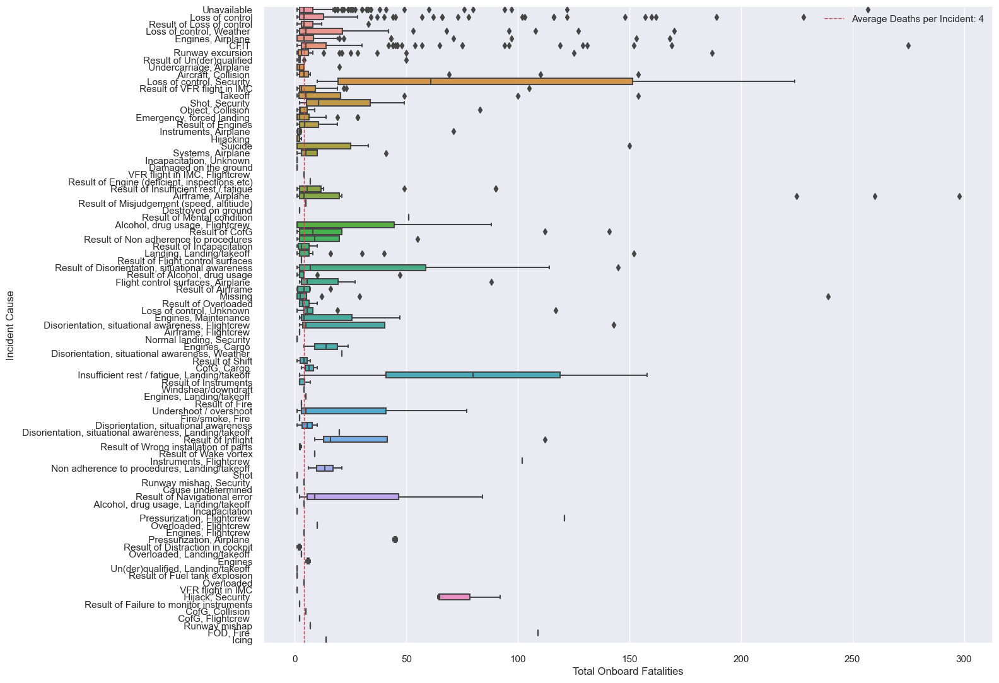

In [ ]:
fig , ax = plt.subplots(figsize=(16, 11))
sns.boxplot(box_fatal, y='Incident Cause', x='Total Onboard Fatalities')

#plt.xticks(rotation = 290)
ax.set_xlabel('Total Onboard Fatalities')
ax.axvline(average_deaths, color='r', label=f'Average Deaths per Incident: {average_deaths:0.0f}', linestyle='--', linewidth=1)
ax.legend().set_visible(True)
plt.tight_layout()


In [ ]:
air_disaster_2000s

,Incident_Date,Aircaft_Model,Aircaft_Registration,Aircaft_Operator,Aircaft_Nature,Incident_Category,Incident_Cause(es),Incident_Location,Aircaft_Damage_Type,Date,...,Year,incident_count,Total Occupants,Total Passengers,Total Crew,Total Onboard Fatalities,Total Passenger Fatalities,Total Crew Fatalities,Fatal or Not,Incident Cause
0,2022-01-03,British Aerospace 4121 Jetstream 41,ZS-NRJ,SA Airlink,Domestic Non Scheduled Passenger,Accident | repairable-damage,"Airplane - Engines, Airplane - Engines - Prop/...",near Venetia Mine...,Substantial,Monday 3 January 2022,...,2022,1,7,4,3,0,0,0,0,"Engines, Airplane"
1,2022-01-04,British Aerospace 3101 Jetstream 31,HR-AYY,LANHSA,Domestic Scheduled Passenger,Accident | repairable-damage,"Airplane - Undercarriage, Airplane - Undercarr...",Roatán-Juan ...,Substantial,Tuesday 4 January 2022,...,2022,1,19,0,0,0,0,0,0,"Undercarriage, Airplane"
2,2022-01-05,Boeing 737-4H6,EP-CAP,Caspian Airlines,Domestic Scheduled Passenger,Accident | repairable-damage,"Airplane - Undercarriage, Airplane - Undercarr...",Isfahan-Shah...,Substantial,Wednesday 5 January 2022,...,2022,1,116,0,0,0,0,0,0,"Undercarriage, Airplane"
3,2022-01-08,Tupolev Tu-204-100C,RA-64032,"Cainiao, opb Aviastar-TU",Cargo,Accident | hull-loss,"Cargo - Fire/smoke, Result - Damaged on the gr...",Hangzhou-Xia...,Destroyed,Saturday 8 January 2022,...,2022,1,8,0,8,0,0,0,0,"Fire/smoke, Result"
4,2022-01-12,Beechcraft 200 Super King Air,NA,private,Illegal Flight,"Criminal occurrence (sabotage, shoot down) | h...",Result - Damaged on the ground,"Machakilha, ...",Damaged beyond repair,Wednesday 12 January 2022,...,2022,1,0,0,0,0,0,0,0,Damaged on the ground
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4583,2000-12-23,McDonnell Douglas DC-10-10,N132AA,"American Airlines, op.for Hawaiian Airlines",International Scheduled Passenger,Accident | repairable-damage,Result - Runway excursion,Papeete-Faaa...,Substantial,Saturday 23 December 2000,...,2000,1,154,139,15,0,0,0,0,Runway excursion
4584,2000-12-23,Beechcraft 200 Super King Air,VP-BBK,Videovision Broadcast,Domestic Non Scheduled Passenger,Accident | hull-loss,Result - Loss of control,near Blackbushe A...,Damaged beyond repair,Saturday 23 December 2000,...,2000,1,5,4,1,5,4,1,1,Loss of control
4585,2000-12-29,British Aerospace 4101 Jetstream 41,N323UE,"United Express, opb Atlantic Coast Airlines",Domestic Scheduled Passenger,Accident | hull-loss,Result - Runway excursion,Charlottesvi...,Substantial,Friday 29 December 2000,...,2000,1,18,15,3,0,0,0,0,Runway excursion
4586,2000-12-29,Boeing 747-436,G-BNLM,British Airways,International Scheduled Passenger,Hijacking | repairable-damage,Result - Hijacking - Hijacker(s) overpowered b...,Nairobi-Jomo...,NA,Friday 29 December 2000,...,2000,1,398,379,19,0,0,0,0,Hijacking


/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/seaborn/relational.py:858: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


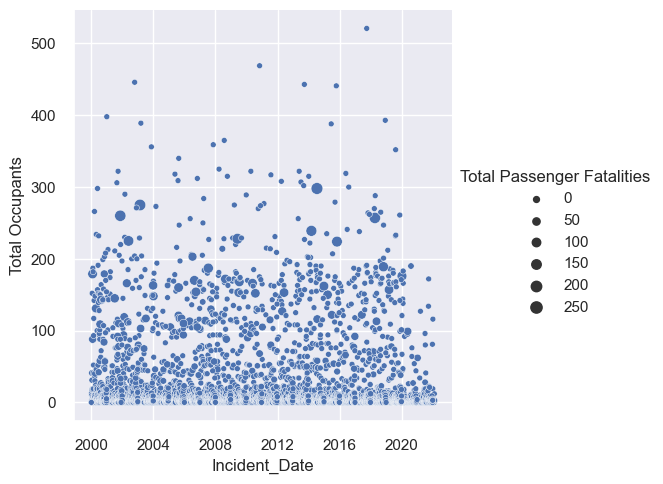

In [ ]:

sns.relplot(data=air_disaster_2000s, x="Incident_Date", y="Total Occupants", size="Total Passenger Fatalities", ax=ax)

/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/seaborn/categorical.py:3544: UserWarning: 91.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/seaborn/categorical.py:3544: UserWarning: 91.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/seaborn/categorical.py:3544: UserWarning: 92.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/seaborn/categorical.py:3544: UserWarning: 93.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/benmacdonald/anaconda3/lib/python

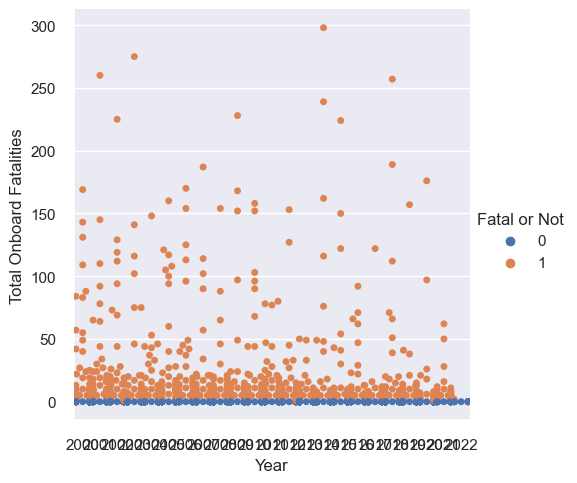

In [ ]:
sns.catplot(data=air_disaster_2000s, x="Year", y="Total Onboard Fatalities", hue="Fatal or Not", kind="swarm")

/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/seaborn/categorical.py:3544: UserWarning: 98.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/seaborn/categorical.py:3544: UserWarning: 71.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/seaborn/categorical.py:3544: UserWarning: 99.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/seaborn/categorical.py:3544: UserWarning: 78.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


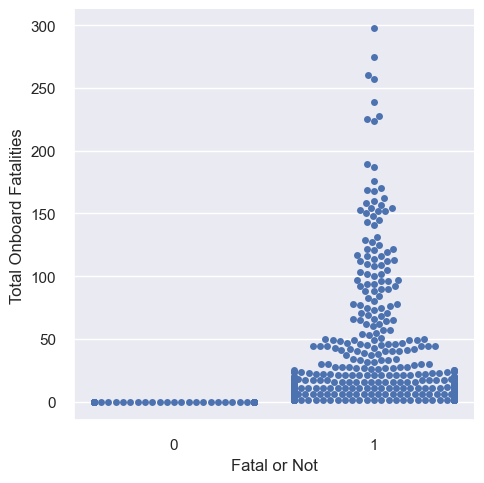

In [ ]:
sns.catplot(data=air_disaster_2000s, x="Fatal or Not", y="Total Onboard Fatalities", kind="swarm")

/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/seaborn/categorical.py:3544: UserWarning: 76.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/seaborn/categorical.py:3544: UserWarning: 72.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/seaborn/categorical.py:3544: UserWarning: 83.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/seaborn/categorical.py:3544: UserWarning: 78.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


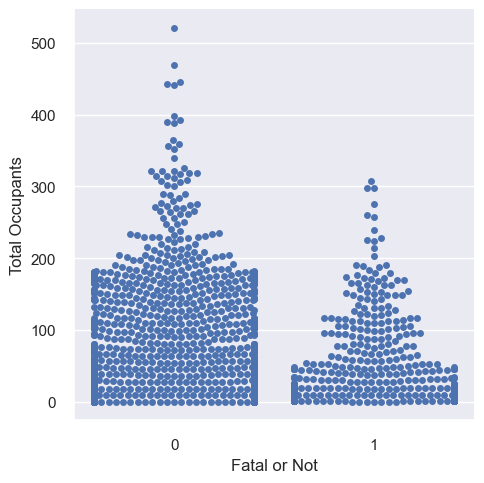

In [ ]:
sns.catplot(data=air_disaster_2000s, x="Fatal or Not", y="Total Occupants", kind="swarm")

In [ ]:
from yellowbrick.target import FeatureCorrelation

/Users/benmacdonald/anaconda3/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


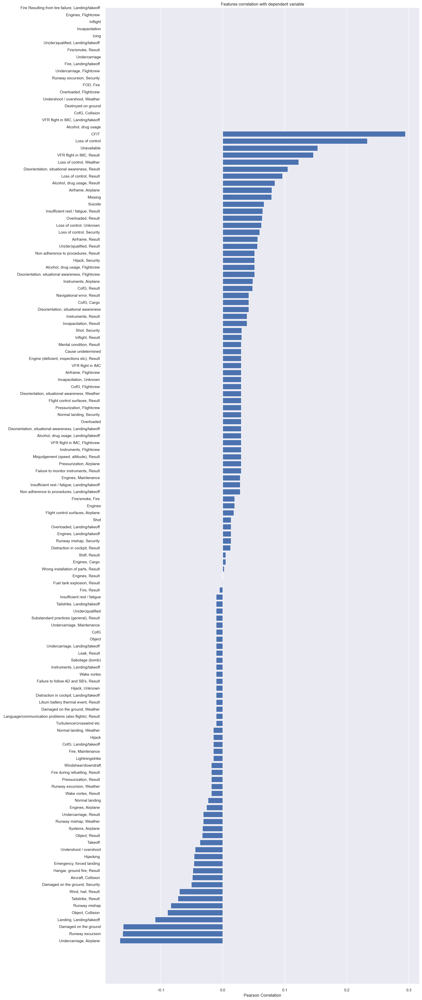

<Axes: title={'center': 'Features correlation with dependent variable'}, xlabel='Pearson Correlation'>

In [ ]:
from yellowbrick.target import FeatureCorrelation

fig, ax = plt.subplots(figsize= (16, 50))

viz = FeatureCorrelation(sort= True)
viz.fit(X_train, y_train)
viz.show()

In [ ]:
X_train

,"Aircraft, Collision","Airframe, Airplane","Airframe, Flightcrew","Airframe, Result","Alcohol, drug usage","Alcohol, drug usage, Flightcrew","Alcohol, drug usage, Landing/takeoff","Alcohol, drug usage, Result",CFIT,Cause undetermined,...,VFR flight in IMC,"VFR flight in IMC, Flightcrew","VFR flight in IMC, Landing/takeoff","VFR flight in IMC, Result",Wake vortex,"Wake vortex, Result","Wind, hail, Result",Windshear/downdraft,"Wrong installation of parts, Result",Unavailable
722,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4295,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2823,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1275,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3872,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2103,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3603,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3340,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3064,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


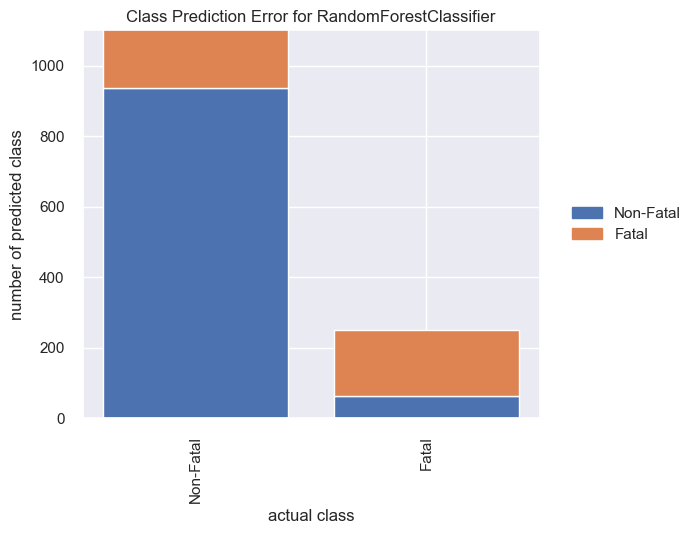

<Axes: title={'center': 'Class Prediction Error for RandomForestClassifier'}, xlabel='actual class', ylabel='number of predicted class'>

In [ ]:

from sklearn.ensemble import RandomForestClassifier
from yellowbrick.classifier import ClassPredictionError

classes = ['Non-Fatal', 'Fatal']
visualizer = ClassPredictionError(
    RandomForestClassifier(random_state=42, n_estimators=10), classes=classes
)

# Fit the training data to the visualizer
visualizer.fit(X_train, y_train)

# Evaluate the model on the test data
visualizer.score(X_test, y_test)

# Draw visualization
visualizer.show()

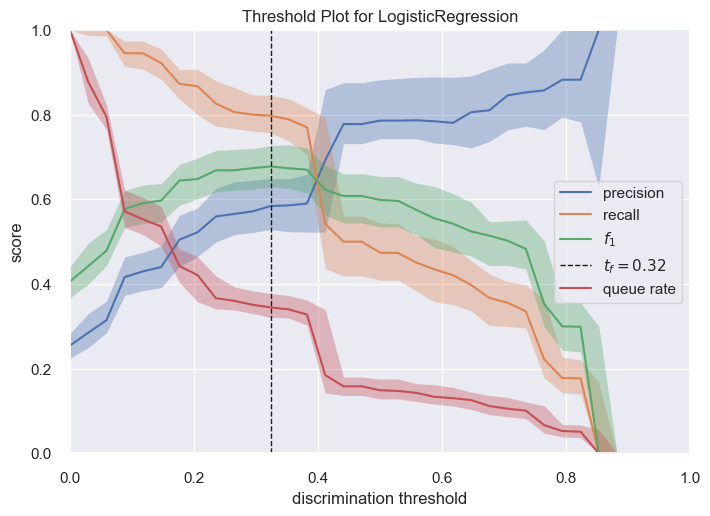

<Axes: title={'center': 'Threshold Plot for LogisticRegression'}, xlabel='discrimination threshold', ylabel='score'>

In [ ]:
from sklearn.linear_model import LogisticRegression

from yellowbrick.classifier import DiscriminationThreshold

model = LogisticRegression(multi_class="auto", solver="liblinear")
visualizer = DiscriminationThreshold(model)

visualizer.fit(X_train, y_train)        # Fit the data to the visualizer
visualizer.show()   

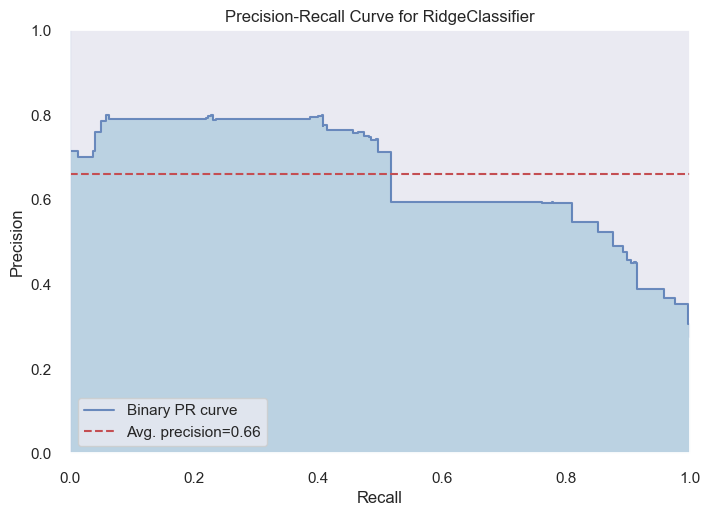

<Axes: title={'center': 'Precision-Recall Curve for RidgeClassifier'}, xlabel='Recall', ylabel='Precision'>

In [ ]:
from sklearn.linear_model import RidgeClassifier
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(RidgeClassifier(random_state=0))
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()